In [1]:
import pickle
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_extraction import text
from sklearn.decomposition import TruncatedSVD
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree
from scipy.cluster.hierarchy import ward
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import fcluster
from sklearn import metrics

from os import listdir
from os.path import isfile, join

# Data Loading

In [2]:
def read_speeches(fp):
    p1 = pd.read_pickle(fp)
    all_speech = pd.DataFrame()
    ps, ds, ss = [], [], []

    for pres in p1.keys():
        d = p1[pres]['Date']
        this_pres = pd.DataFrame({
                'president': [pres]*len(d),
                'date': d,
                'title': p1[pres]['NoS'],
                'speech': p1[pres]['Speech']
            })
    #     display(this_pres)
        all_speech = all_speech.append(this_pres)
        
    return all_speech

fp = 'SpeechDictionary_complete.pkl'
speeches = read_speeches(fp)

In [3]:
files = [f for f in listdir('./Translated')
         if isfile(join('./Translated', f))]
pdd_speech = pd.DataFrame(columns=['year', 'speech'])

for item in files:
    with open('./Translated/'+item) as f:
        df = pd.read_csv(f, delimiter='/t', header=None)
        pdd_speech = pdd_speech.append({'year': item[:-4],
                                        'speech': df[0].str.cat(sep="/t")},
                                        ignore_index=True)
pdd_speech

<ipython-input-3-03bb9c4343e3>:7: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  df = pd.read_csv(f, delimiter='/t', header=None)


,year,speech
0,"July 23, 2007",Thank you. Thank you very much Speaker De Vene...
1,"July 24, 2006","Thank you./tThank you, Speaker of Venice. Cong..."
2,"July 28, 1997",Thank you Mr. Speaker. Thank you ladies and ge...
3,"July 24, 2000",Thank you very much./tOur Honorable Vice Presi...
4,"July 24, 2017",Kindly sit down. Thank you for your courtesy./...
5,"July 23, 2001",His Excellency President Ramos; Senate Preside...
6,"July 23, 2018",Senate President Vicente Sotto III and the mem...
7,"July 25, 1994","In the past two years, we have come a long way..."
8,"July 28, 2003",Thank you Speaker de Venecia./tVice President ...
9,"July 25, 2005","Thank you./tThank you, Speaker de Venecia./tVi..."


In [4]:
for row, entry in enumerate(pdd_speech.year.unique()):
    speeches.loc[speeches.date == entry, 'speech'] = pdd_speech['speech'][row]
speeches

,president,date,title,speech
0,Manuel L. Quezon,"November 25, 1935",Message to the First Assembly on National Defense,\n\n\nMessage\nof\nHis Excellency Manuel L. Qu...
1,Manuel L. Quezon,"June 16, 1936",On the Country’s Conditions and Problems,\n\n\nMessage\nof\nHis Excellency Manuel L. Qu...
2,Manuel L. Quezon,"October 18, 1937","Improvement of Philippine Conditions, Philippi...",\n\n\nMessage\nof\nHis Excellency Manuel L. Qu...
3,Manuel L. Quezon,"January 24, 1938",Revision of the System of Taxation,\n\n\nMessage\nof\nHis Excellency Manuel L. Qu...
4,Manuel L. Quezon,"January 24, 1939",The State of the Nation and Important Economic...,\n\n\nMessage\nof\nHis Excellency Manuel L. Qu...
...,...,...,...,...
1,Rodrigo Roa Duterte,"July 24, 2017",Second State of the Nation Address,Kindly sit down. Thank you for your courtesy./...
2,Rodrigo Roa Duterte,"July 23, 2018",Third State of the Nation Address,Senate President Vicente Sotto III and the mem...
3,Rodrigo Roa Duterte,"July 22, 2019",Fourth State of the Nation Address,Thank you. Kindly sit down. How are you?/tSena...
4,Rodrigo Roa Duterte,"July 27, 2020",Fifth State of the Nation Address,Kindly/tSenate President Vicente Sotto III and...


In [5]:
speeches["speech"] = speeches["speech"].replace(r'\n', ' ', regex=True) 
speeches["speech"] = speeches["speech"].replace(r'\t', ' ', regex=True) 
speeches["speech"] = speeches["speech"].replace(r' \d+', ' ', regex=True)
speeches["speech"] = speeches["speech"].replace(r"'", '', regex=True)
speeches["speech"] = speeches["speech"].replace(r"’", '', regex=True)
speeches["speech"] = speeches["speech"].replace(r'/t', ' ', regex=True)
speeches["speech"] = speeches["speech"].replace(r"U. S.", 'United States', regex=True)
speeches["speech"] = speeches["speech"].replace(r"U.S.", 'United States', regex=True)
speeches["speech"] = speeches["speech"].replace(r"barangays", 'barangay', regex=True)
speeches["speech"] = speeches["speech"].str.lower()

speeches

,president,date,title,speech
0,Manuel L. Quezon,"November 25, 1935",Message to the First Assembly on National Defense,message of his excellency manuel l. quezon ...
1,Manuel L. Quezon,"June 16, 1936",On the Country’s Conditions and Problems,message of his excellency manuel l. quezon ...
2,Manuel L. Quezon,"October 18, 1937","Improvement of Philippine Conditions, Philippi...",message of his excellency manuel l. quezon ...
3,Manuel L. Quezon,"January 24, 1938",Revision of the System of Taxation,message of his excellency manuel l. quezon ...
4,Manuel L. Quezon,"January 24, 1939",The State of the Nation and Important Economic...,message of his excellency manuel l. quezon ...
...,...,...,...,...
1,Rodrigo Roa Duterte,"July 24, 2017",Second State of the Nation Address,kindly sit down. thank you for your courtesy. ...
2,Rodrigo Roa Duterte,"July 23, 2018",Third State of the Nation Address,senate president vicente sotto iii and the mem...
3,Rodrigo Roa Duterte,"July 22, 2019",Fourth State of the Nation Address,thank you. kindly sit down. how are you? senat...
4,Rodrigo Roa Duterte,"July 27, 2020",Fifth State of the Nation Address,kindly senate president vicente sotto iii and ...


# Data Preparation

In [12]:
import nltk 
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')

#Tokenization
speeches['tokenized'] = speeches['speech'].apply(word_tokenize)

#Lemmatization
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(w) for w in text]

speeches['tokenized'] = speeches['tokenized'].apply(lemmatize_text)
speeches['tokenized_2'] = speeches['tokenized'].str.join(" ")
speeches

[nltk_data] Downloading package wordnet to
[nltk_data]     /home/msds2022/mcastro/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /home/msds2022/mcastro/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/msds2022/mcastro/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,president,date,title,speech,tokenized,tokenized_2
0,Manuel L. Quezon,"November 25, 1935",Message to the First Assembly on National Defense,message of his excellency manuel l. quezon ...,"[message, of, his, excellency, manuel, l., que...",message of his excellency manuel l. quezon pre...
1,Manuel L. Quezon,"June 16, 1936",On the Country’s Conditions and Problems,message of his excellency manuel l. quezon ...,"[message, of, his, excellency, manuel, l., que...",message of his excellency manuel l. quezon pre...
2,Manuel L. Quezon,"October 18, 1937","Improvement of Philippine Conditions, Philippi...",message of his excellency manuel l. quezon ...,"[message, of, his, excellency, manuel, l., que...",message of his excellency manuel l. quezon pre...
3,Manuel L. Quezon,"January 24, 1938",Revision of the System of Taxation,message of his excellency manuel l. quezon ...,"[message, of, his, excellency, manuel, l., que...",message of his excellency manuel l. quezon pre...
4,Manuel L. Quezon,"January 24, 1939",The State of the Nation and Important Economic...,message of his excellency manuel l. quezon ...,"[message, of, his, excellency, manuel, l., que...",message of his excellency manuel l. quezon pre...
...,...,...,...,...,...,...
1,Rodrigo Roa Duterte,"July 24, 2017",Second State of the Nation Address,kindly sit down. thank you for your courtesy. ...,"[kindly, sit, down, ., thank, you, for, your, ...",kindly sit down . thank you for your courtesy ...
2,Rodrigo Roa Duterte,"July 23, 2018",Third State of the Nation Address,senate president vicente sotto iii and the mem...,"[senate, president, vicente, sotto, iii, and, ...",senate president vicente sotto iii and the mem...
3,Rodrigo Roa Duterte,"July 22, 2019",Fourth State of the Nation Address,thank you. kindly sit down. how are you? senat...,"[thank, you, ., kindly, sit, down, ., how, are...",thank you . kindly sit down . how are you ? se...
4,Rodrigo Roa Duterte,"July 27, 2020",Fifth State of the Nation Address,kindly senate president vicente sotto iii and ...,"[kindly, senate, president, vicente, sotto, ii...",kindly senate president vicente sotto iii and ...


In [13]:

newStopWords = ['ha','wa', 'u', 'applause', 
                "ng","sa","na","mga","ang","ay","at","isang","ito",
                "ni","may","bilang","si","hindi","noong","mula",
                "para","kung","nito","pang","tao","pag","upang",
                "kanyang","siya","iba","rin","ibang","kanilang",
                "dahil","pa","lamang","isa","din","maaaring","nasa",
                "niya","nang","pamamagitan","kay","hanggang","ilang",
                "akin","aking","ako","alin","am","amin","aming","ang",
                "ano","anumang","apat","at","atin","ating","ay",
                "bababa","bago","bakit","bawat","bilang","dahil",
                "dalawa","dapat","din","dito","doon","gagawin",
                "gayunman","ginagawa","ginawa","ginawang","gumawa",
                "gusto","habang","hanggang","hindi","huwag","iba",
                "ibaba","ibabaw","ibig","ikaw","ilagay","ilalim",
                "ilan","inyong","isa","isang","itaas","ito","iyo",
                "iyon","iyong","ka","kahit","kailangan","kailanman",
                "kami","kanila","kanilang","kanino","kanya","kanyang",
                "kapag","kapwa","karamihan","katiyakan","katulad",
                "kaya","kaysa","ko","kong","kulang","kumuha","kung",
                "laban","lahat","lamang","likod","lima","maaari",
                "maaaring","maging","mahusay","makita","marami",
                "marapat","masyado","may","mayroon","mga","minsan",
                "mismo","mula","muli","na","nabanggit","naging",
                "nagkaroon","nais","nakita","namin","napaka","narito",
                "nasaan","ng","ngayon","ni","nila","nilang","nito",
                "niya","niyang","noon","o","pa","paano","pababa",
                "paggawa","pagitan","pagkakaroon","pagkatapos",
                "palabas","pamamagitan","panahon","pangalawa","para",
                "paraan","pareho","pataas","pero","pumunta",
                "pumupunta","sa","saan","sabi","sabihin","sarili",
                "sila","sino","siya","tatlo","tayo","tulad",
                "tungkol","una","wala", "walang",
                'www','youtube','com','http', 'translated', 'transcript']

my_stop_words = text.ENGLISH_STOP_WORDS.union(newStopWords)

tfidfvec = TfidfVectorizer(stop_words=my_stop_words,
                           token_pattern=u'(?ui)\\b[a-z]+\\b',
                           ngram_range=(2,2))

tfidf_tokenized = tfidfvec.fit_transform(speeches["tokenized_2"])
feature_array = tfidfvec.get_feature_names()

print(len(feature_array))
df_tfidf = pd.DataFrame(tfidf_tokenized.toarray(), columns=feature_array)
df_tfidf

218395


,aabot bilyon,aabot pinakamababa,aapat porsiento,ab just,ab rappler,abaca cent,abaca chip,abaca cited,abaca coconut,abaca commodity,...,zoom sorsogon,zoomed im,zoomed owing,zooming double,zopad southern,zopad spcpd,zte scandal,zubiri mindanao,zubiri sponsoring,zubiri term
0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,0.0,0.0,0.0,0.014099,0.014099,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
79,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
80,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
81,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Dimensionality Reduction

83


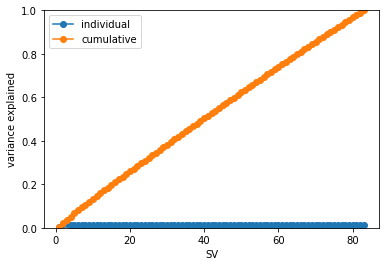

In [14]:
from sklearn.decomposition import TruncatedSVD

svd_model = TruncatedSVD(n_components=83)
svd_model.fit(tfidf_tokenized)
svd_results = svd_model.fit_transform(tfidf_tokenized)
ve = svd_model.explained_variance_ratio_
print(len(ve.cumsum() < 1))

fig, ax = plt.subplots()
ax.plot(range(1, len(ve)+1), ve, 'o-', label='individual')
ax.plot(range(1, len(ve)+1), ve.cumsum(), 'o-', label='cumulative')
ax.legend()
ax.set_ylim(0, 1)
ax.set_xlabel('SV')
ax.set_ylabel('variance explained');

In [ ]:
df_tags = pd.DataFrame()
d_all = {}
for i, comp in enumerate(svd_model.components_):   
    best_features = [(feature_array[n], np.abs(svd_model.components_[i][n]))
                 for n in np.abs(svd_model.components_[i].argsort())[::-1]] 
    d_ = {}
    d_["SV_"+str(i)] = best_features  
    d_all.update(d_)

df_tags = df_tags.from_dict(d_all)
df_tags

In [ ]:
dist = 1 - cosine_similarity(svd_results)
Z2 = linkage(dist, method="ward", metric='euclidean', optimal_ordering=True)
y_predict_Z2 = fcluster(Z2, t=1.68, criterion='distance')
X_res_new = PCA(n_components=2, random_state=1337).fit_transform(dist)
plt.scatter(X_res_new[:,0], X_res_new[:,1], c=y_predict_Z2)

In [ ]:
speeches['clusters_2'] = y_predict_Z2

# Word Clouds

In [ ]:
class MyColorFunctor():
    "A class function for changing font colo words in the word cloud "
    def __init__(self,frequencies, thresh):
        self.frequencies = frequencies
        self.thresh = thresh

    def __call__(self,word,font_size,position,orientation,random_state=None,**kwargs):
        if self.frequencies[word] >= self.thresh:
            #return '#b20a45'
            #return '#F5F307'
            return '#E1AD01'
        else:
            return 'gainsboro'

In [10]:
class MyColorFunctor2():
    def __init__(self,frequencies, thresh):
        self.frequencies = frequencies
        self.thresh = thresh

    def __call__(self,word,font_size,position,orientation,random_state=None,**kwargs):
        return 'gainsboro'

## Cluster 1 - Martial Law

In [8]:
cluster1 = speeches[speeches['clusters_2'] == 1]
tfidf_cl1 = tfidfvec.fit_transform(cluster1["tokenized_2"])
feature_cl1 = tfidfvec.get_feature_names()

sums = tfidf_cl1.sum(axis=0)

# connecting term to its sums frequency
data_cl1 = []
for col, term in enumerate(feature_cl1):
    data_cl1.append((term, sums[0,col]*100))

ranking = pd.DataFrame(data_cl1, columns=['term','rank'])
rank = ranking.sort_values('rank', ascending=False)
rank

KeyError: 'clusters_2'

In [7]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.colors

data = rank.set_index('term').to_dict()['rank']
CustomCmap = matplotlib.colors.ListedColormap(['#FFFFFF', '#808080'])
wordcloud = WordCloud(background_color="#E1AD01", min_font_size=8, colormap=CustomCmap,
                          prefer_horizontal=1).generate_from_frequencies(frequencies=data)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
#plt.set_title(str(df_excel.columns[i]), fontsize=16)
plt.axis("off")

NameError: name 'rank' is not defined

In [6]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("ML2.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      background_color='#323672',
                      colormap='Set2', 
                      collocations=False,
                      prefer_horizontal=1,
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_ml.jpg', bbox_inches='tight', pad_inches = 0)

NameError: name 'WordCloud' is not defined

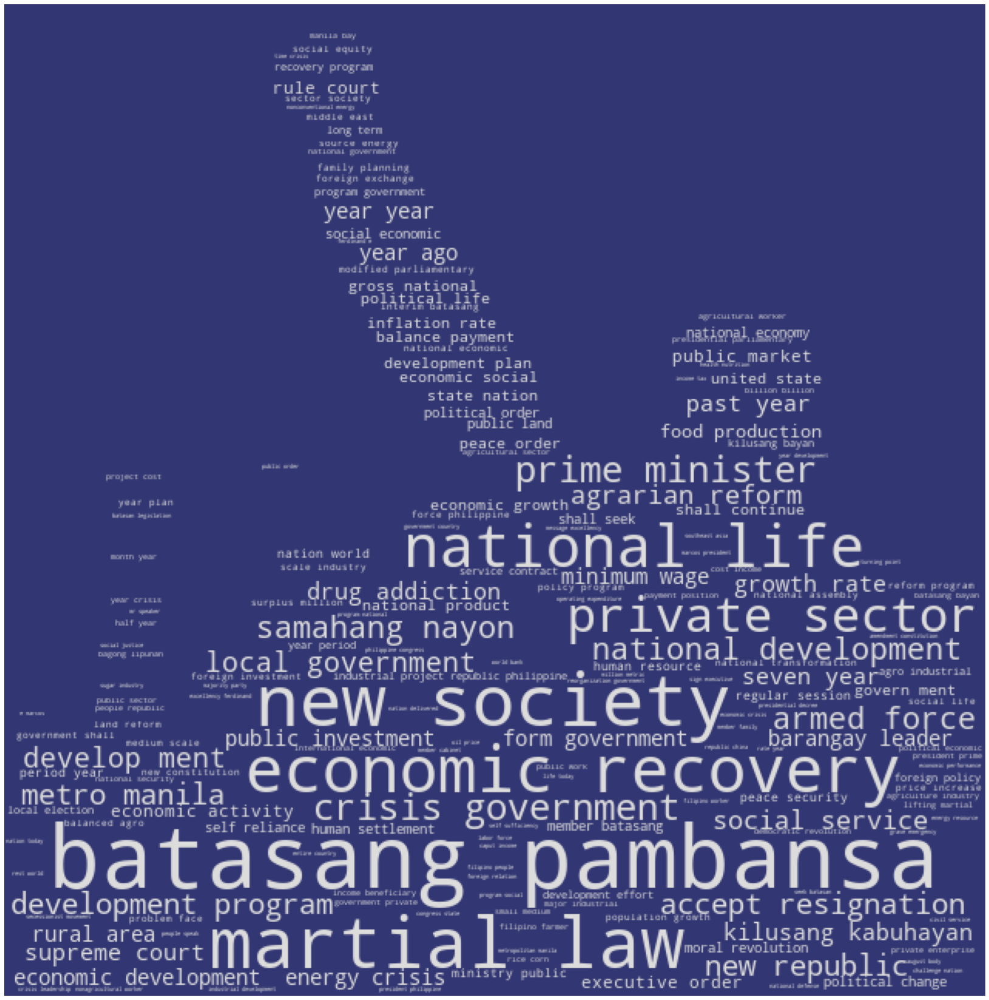

In [262]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("ML2.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      background_color='#323672',
                      colormap='Set2', 
                      collocations=False,
                      prefer_horizontal=1,
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor2(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_ml_2.jpg', bbox_inches='tight', pad_inches = 0)

In [263]:
svd_cl1 = TruncatedSVD(n_components=83)
svd_cl1.fit(tfidf_cl1)
svd_cl1_results = svd_cl1.fit_transform(tfidf_cl1)
ve_cl1 = svd_cl1.explained_variance_ratio_
len(ve_cl1.cumsum() < 1)

svd_cl1 = TruncatedSVD(n_components=len(ve_cl1.cumsum() < 1))
svd_cl1.fit(tfidf_cl1)
svd_cl1_results = svd_cl1.fit_transform(tfidf_cl1)
ve_cl1 = svd_cl1.explained_variance_ratio_

df_tags = pd.DataFrame()
d_all = {}
for i, comp in enumerate(svd_cl1.components_):   
    best_features = [(feature_cl1[n], np.abs(svd_cl1.components_[i][n]))
                 for n in np.abs(svd_cl1.components_[i].argsort())[::-1]] 
    d_ = {}
    d_["SV_"+str(i)] = best_features  
    d_all.update(d_)

df_tags = df_tags.from_dict(d_all)
df_tags.head(10)

,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,SV_10,SV_11,SV_12
0,"(batasang pambansa, 0.14350305264746466)","(new society, 0.09629061365425505)","(economic recovery, 0.13267002894084898)","(seven year, 0.08063736694050973)","(samahang nayon, 0.17071307450159195)","(samahang nayon, 0.06590606339775221)","(accept resignation, 0.17060555289748291)","(samahang nayon, 0.05307835684651495)","(armed force, 0.05226420604364869)","(public investment, 0.08945887308565331)","(new republic, 0.09144799430396086)","(political change, 0.07700374487458503)","(inflation rate, 0.06756687916120105)"
1,"(martial law, 0.0831403405118759)","(accept resignation, 0.08554973253549997)","(recovery program, 0.06537238321898678)","(armed force, 0.07782667195091614)","(drug addiction, 0.12312090366761659)","(public land, 0.05880546839625147)","(filipino farmer, 0.0710856470406179)","(armed force, 0.05127056223085502)","(favorable balance, 0.03482510932480155)","(moral revolution, 0.04853131614853302)","(income beneficiary, 0.06972276468107728)","(local election, 0.05323000975869933)","(agricultural sector, 0.05522771324312336)"
2,"(new society, 0.07859689667060661)","(samahang nayon, 0.08475189497390041)","(inflation rate, 0.061521600675934436)","(energy crisis, 0.0670355033094395)","(barangay leader, 0.09145849464928875)","(executive order, 0.05069580835368095)","(acceptance resignation, 0.05686851763249431)","(seven year, 0.04605180554825689)","(balance trade, 0.03482510932480155)","(family planning, 0.044445240137195245)","(cost income, 0.06972276468107728)","(local government, 0.04972416947285224)","(household income, 0.042849955191344)"
3,"(crisis government, 0.07587649006350837)","(drug addiction, 0.0575680985045304)","(month year, 0.05657032927640736)","(accept resignation, 0.0638834474238427)","(kilusang bayan, 0.08208060244507771)","(new republic, 0.049799237666785345)","(resignation director, 0.05686851763249431)","(barangay leader, 0.04408233907289699)","(capitalization million, 0.03482510932480155)","(rule court, 0.04294788930268075)","(kilusang kabuhayan, 0.06562898762534333)","(presidential parliamentary, 0.04680878538985799)","(democratic institution, 0.042849955191344)"
4,"(national life, 0.07321610225988447)","(barangay leader, 0.04589976469385332)","(shall seek, 0.052700386471151946)","(samahang nayon, 0.06259704445421216)","(sign decree, 0.05130037652817357)","(drug addiction, 0.0480759762183222)","(new society, 0.05018106217735555)","(million metric, 0.044004343687466876)","(moral revolution, 0.03306649343843986)","(modified parliamentary, 0.040442763457110835)","(ministry public, 0.05587376680399419)","(private enterprise, 0.04454693238930985)","(percentage point, 0.042849955191344)"
5,"(prime minister, 0.07192718254531846)","(martial law, 0.04011895944184891)","(agricultural sector, 0.05226751228274792)","(force philippine, 0.047549622020595275)","(barangay barrio, 0.05130037652817357)","(public market, 0.04338218523772441)","(people speak, 0.049020579713062354)","(drug addiction, 0.04246014271029752)","(shall continue, 0.03281699954483703)","(batasang bayan, 0.037229642576367974)","(beneficiary beneficiary, 0.05577821174486181)","(interim batasang, 0.044370767975724666)","(turning point, 0.04113912065554551)"
6,"(economic recovery, 0.07111138469618786)","(public investment, 0.03983239400776852)","(period year, 0.0514699962811025)","(income tax, 0.04444000730770722)","(martial law, 0.04345792656752747)","(medium scale, 0.04082981571420272)","(accepted resignation, 0.04265138822437073)","(growth rate, 0.037428206836949536)","(rule court, 0.03127117388489879)","(agrarian reform, 0.03509071204443802)","(project cost, 0.05270809029957459)","(binubuksan natin, 0.04277519962513929)","(june year, 0.03339978787362823)"
7,"(private sector, 0.06779883330521429)","(kilusang bayan, 0.03837873233635358)","(payment position, 0.04971030566316492)","(barangay leader, 0.04374583335591603)","(today barangay, 0.04104030122253886)","(major industr

## Cluster 2 - Economy Focused

In [264]:
cluster2 = speeches[speeches['clusters_2'] == 2]
tfidf_cl2 = tfidfvec.fit_transform(cluster2["tokenized_2"])
feature_cl2 = tfidfvec.get_feature_names()

sums = tfidf_cl2.sum(axis=0)

# connecting term to its sums frequency
data_cl2 = []
for col, term in enumerate(feature_cl2):
    data_cl2.append((term, sums[0,col]*100))

ranking = pd.DataFrame(data_cl2, columns=['term','rank'])
rank = ranking.sort_values('rank', ascending=False)
rank

,term,rank
7619,billion peso,72.515634
4714,ask congress,55.951597
49672,metro manila,51.491291
29700,filipino people,50.537846
56149,past year,50.090286
...,...,...
80142,tetangco deftly,1.160631
4815,asked afp,1.160631
41105,island change,1.160631
69355,rifle total,1.160631


(-0.5, 399.5, 199.5, -0.5)

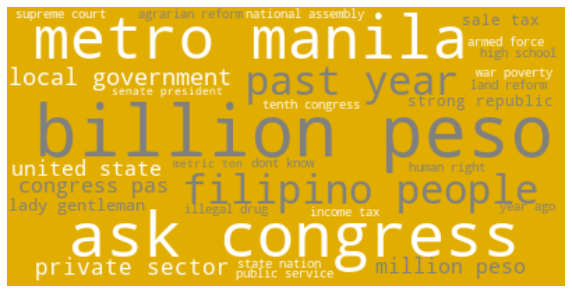

In [265]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.colors

data = rank.set_index('term').to_dict()['rank']
CustomCmap = matplotlib.colors.ListedColormap(['#FFFFFF', '#808080'])
wordcloud = WordCloud(background_color="#E1AD01", min_font_size=8, colormap=CustomCmap,
                          prefer_horizontal=1).generate_from_frequencies(frequencies=data)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
#plt.set_title(str(df_excel.columns[i]), fontsize=16)
plt.axis("off")

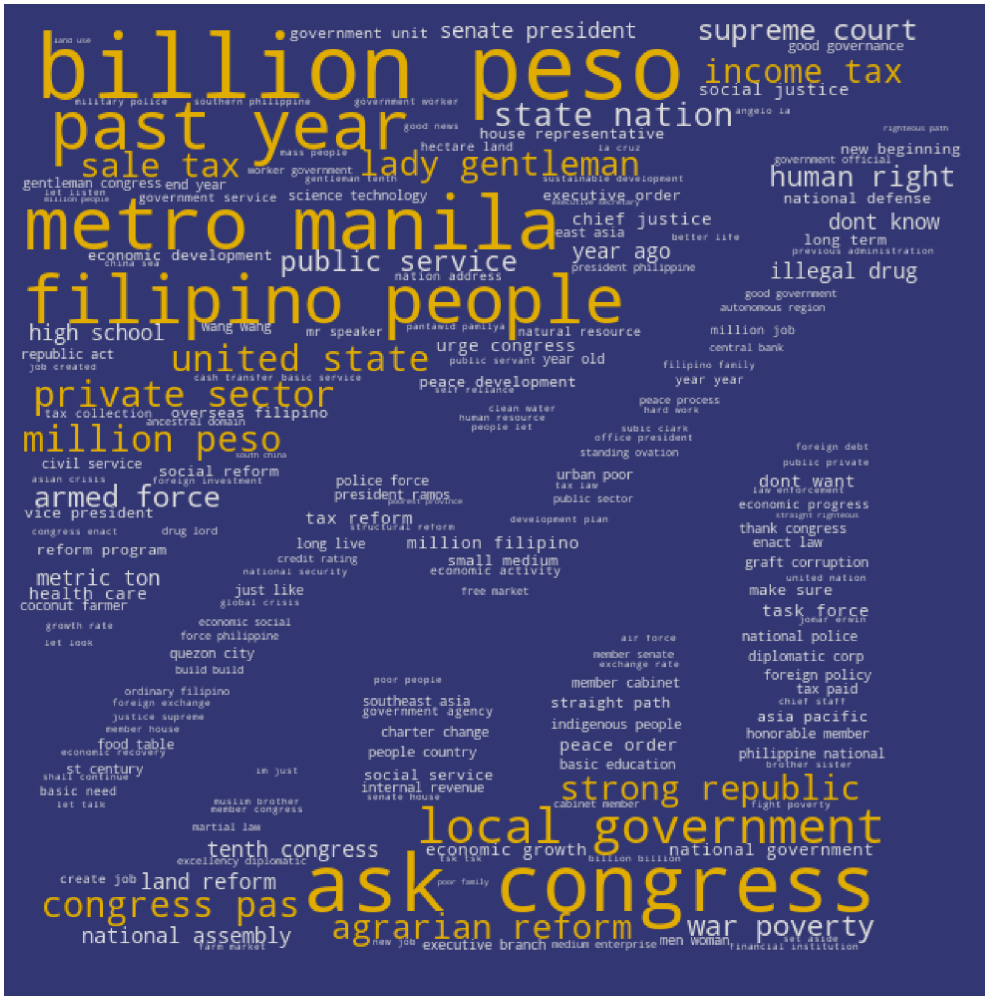

In [266]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("Economy.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      background_color='#323672',
                      colormap='Set2', 
                      collocations=False,
                      prefer_horizontal=1,
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_economy.jpg', bbox_inches='tight' ,pad_inches = 0)

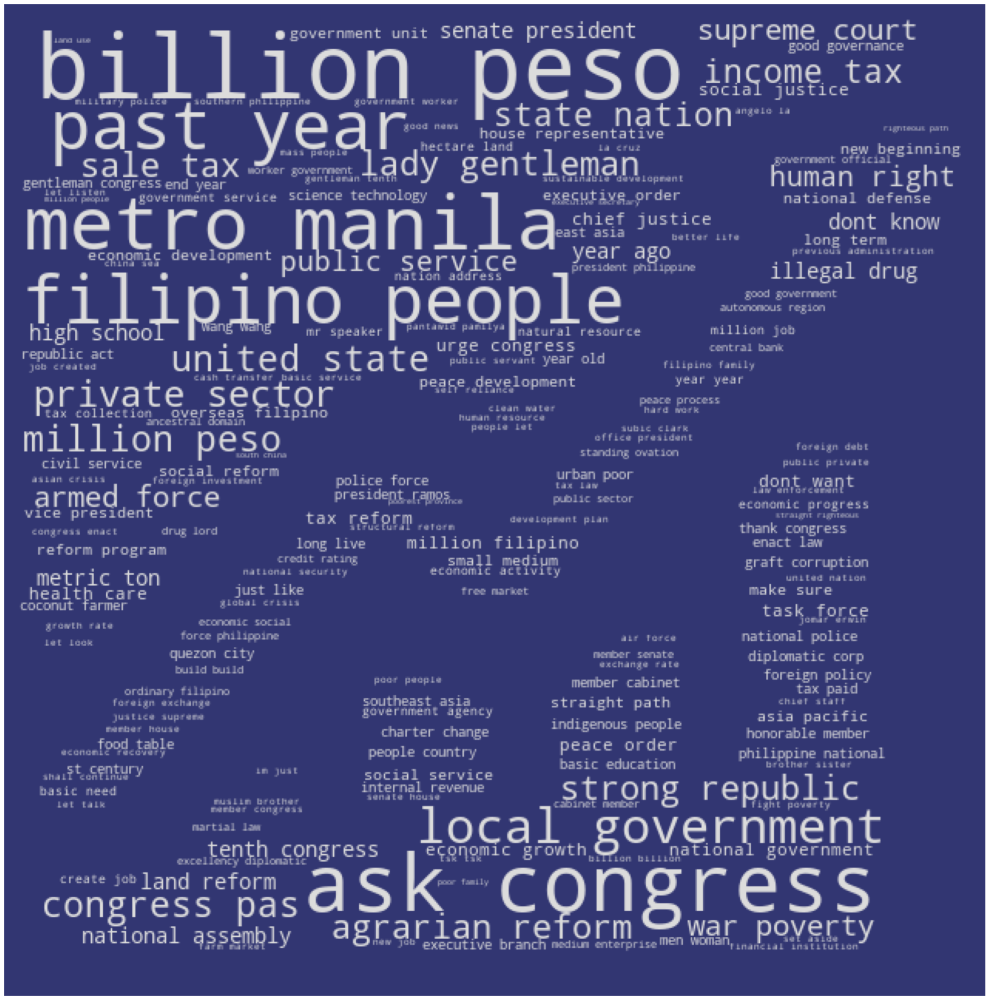

In [267]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("Economy.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      background_color='#323672',
                      colormap='Set2', 
                      collocations=False,
                      prefer_horizontal=1,
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor2(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_economy2.jpg', bbox_inches='tight' ,pad_inches = 0)

## Cluster 3 - Commonwealth


In [14]:
cluster3 = speeches[speeches['clusters_2'] == 3]
tfidf_cl3 = tfidfvec.fit_transform(cluster3["tokenized_2"])
feature_cl3 = tfidfvec.get_feature_names()

sums = tfidf_cl3.sum(axis=0)

# connecting term to its sums frequency
data_cl3 = []
for col, term in enumerate(feature_cl3):
    data_cl3.append((term, sums[0,col]*100))

ranking = pd.DataFrame(data_cl3, columns=['term','rank'])
rank = ranking.sort_values('rank', ascending=False)
rank.head(20)

,term,rank
14577,united state,95.204119
8922,national assembly,49.062789
5367,filipino people,28.998122
10721,president roosevelt,26.470239
2363,commonwealth act,25.754058
8359,manila railroad,19.291040
14306,trade relation,19.004817
11531,railroad company,18.320685
6455,high commissioner,18.317573
2488,complete independence,16.512885


(-0.5, 399.5, 199.5, -0.5)

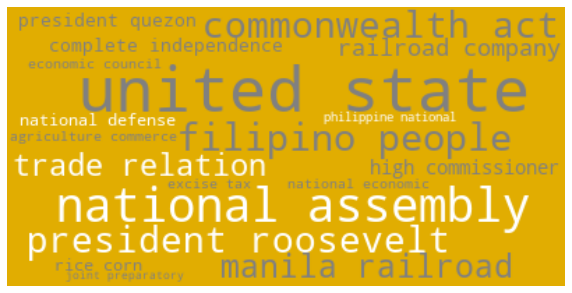

In [15]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.colors

data = rank.set_index('term').to_dict()['rank']
CustomCmap = matplotlib.colors.ListedColormap(['#FFFFFF', '#808080'])
wordcloud = WordCloud(background_color="#E1AD01", min_font_size=8, colormap=CustomCmap,
                          prefer_horizontal=1).generate_from_frequencies(frequencies=data)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
#plt.set_title(str(df_excel.columns[i]), fontsize=16)
plt.axis("off")

In [17]:
svd_cl3 = TruncatedSVD(n_components=83)
svd_cl3.fit(tfidf_cl3)
svd_cl3_results = svd_cl3.fit_transform(tfidf_cl3)
ve_cl3 = svd_cl3.explained_variance_ratio_
len(ve_cl3.cumsum() < 1)

svd_cl3 = TruncatedSVD(n_components=len(ve_cl3.cumsum() < 1))
svd_cl3.fit(tfidf_cl3)
svd_cl3_results = svd_cl3.fit_transform(tfidf_cl3)
ve_cl3 = svd_cl3.explained_variance_ratio_

df_tags = pd.DataFrame()
d_all = {}
for i, comp in enumerate(svd_cl3.components_):   
    best_features = [(feature_cl3[n], np.abs(svd_cl3.components_[i][n]))
                 for n in np.abs(svd_cl3.components_[i].argsort())[::-1]] 
    d_ = {}
    d_["SV_"+str(i)] = best_features  
    d_all.update(d_)

df_tags = df_tags.from_dict(d_all)
df_tags.head(10)

,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5
0,"(united state, 0.33865352326089887)","(united state, 0.14409966881478445)","(manila railroad, 0.08659950834274095)","(national assembly, 0.10182126057109273)","(public work, 0.04799749510767459)","(complete independence, 0.1244132820147628)"
1,"(national assembly, 0.17909384287259145)","(president roosevelt, 0.14012370675484778)","(accordance provision, 0.08110038504211377)","(economic council, 0.05705112537108537)","(settlement administration, 0.045072666140024795)","(trade relation, 0.11011330507778268)"
2,"(filipino people, 0.10397548277282755)","(filipino people, 0.1367773757017387)","(railroad company, 0.07858058413693421)","(national economic, 0.05705112537108537)","(national park, 0.045072666140024795)","(high commissioner, 0.06780551611365111)"
3,"(president roosevelt, 0.09179067762856569)","(president quezon, 0.10255558050271137)","(loan investment, 0.06758365420176148)","(proceeds excise, 0.05001885383626329)","(national land, 0.045072666140024795)","(chairman committee, 0.055294792006561254)"
4,"(commonwealth act, 0.08860291799905529)","(complete independence, 0.07575164486657208)","(investment board, 0.06758365420176148)","(industry agriculture, 0.04954152994209806)","(internal revenue, 0.045072666140024795)","(relation united, 0.046734646683731916)"
5,"(trade relation, 0.0737504830571582)","(trade relation, 0.06303004897287137)","(national loan, 0.06758365420176148)","(report recommendation, 0.04954152994209806)","(public service, 0.03605813291201984)","(primary instruction, 0.043173267472367334)"
6,"(high commissioner, 0.06739796288423391)","(general macarthur, 0.05411595021337616)","(friar land, 0.056579266732034374)","(tax commission, 0.04954152994209806)","(private school, 0.03605813291201984)","(independence advanced, 0.04147109400492093)"
7,"(complete independence, 0.0645536675725871)","(senator tydings, 0.05411595021337616)","(tax law, 0.05406692336140918)","(group bloc, 0.04954152994209806)","(private education, 0.03605813291201984)","(number child, 0.04147109400492093)"
8,"(manila railroad, 0.06295729408952323)","(united nation, 0.040586962660032117)","(armed force, 0.05406692336140918)","(trade relation, 0.04389860078950808)","(treasury certificate, 0.03605813291201984)","(school building, 0.04147109400492093)"
9,"(railroad company, 0.06001395448247214)","(philippine assembly, 0.040586962660032117)","(saving principal, 0.05406692336140918)","(public health, 0.038298038043059146)","(average average, 0.03605813291201984)","(employer employee, 0.04147109400492093)"


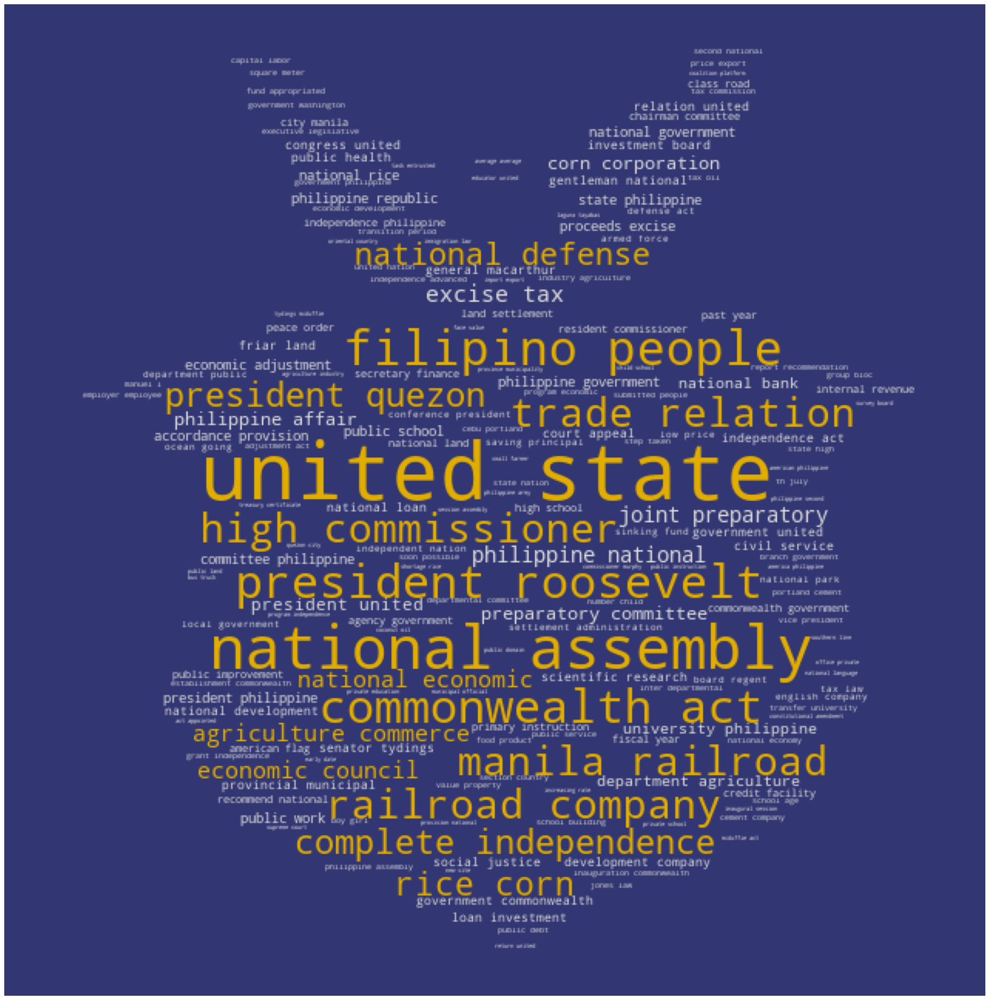

In [18]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("commonwealth2.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      background_color='#323672',
                      colormap='Set2', 
                      collocations=False,
                      prefer_horizontal=1,
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_commonweath.jpg', bbox_inches='tight',pad_inches = 0)

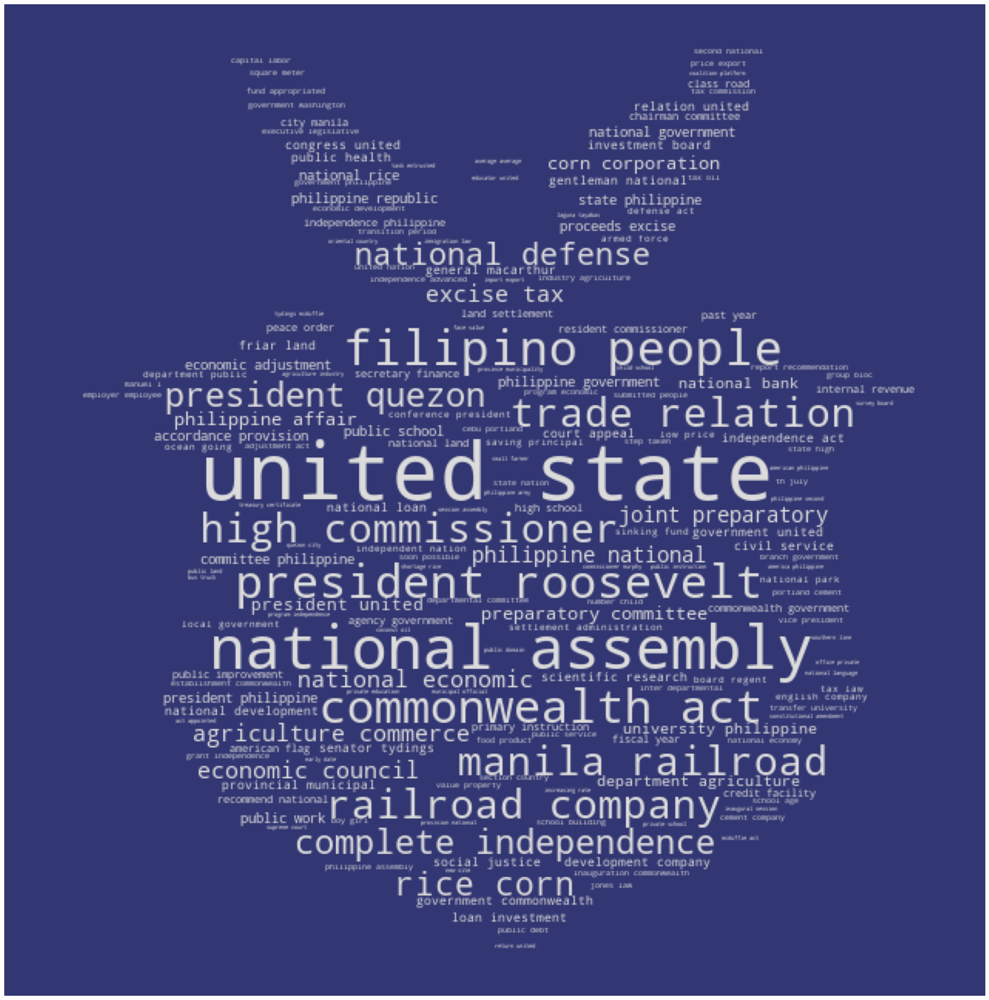

In [19]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("commonwealth2.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      background_color='#323672',
                      colormap='Set2', 
                      collocations=False,
                      prefer_horizontal=1,
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor2(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_commonweath2.jpg', bbox_inches='tight',pad_inches = 0)

## Cluster 4 - Developing

In [20]:
cluster4 = speeches[speeches['clusters_2'] == 4]
tfidf_cl4 = tfidfvec.fit_transform(cluster4["tokenized_2"])
feature_cl4 = tfidfvec.get_feature_names()

sums = tfidf_cl4.sum(axis=0)

# connecting term to its sums frequency
data_cl4 = []
for col, term in enumerate(feature_cl4):
    data_cl4.append((term, sums[0,col]*100))

ranking = pd.DataFrame(data_cl4, columns=['term','rank'])
rank = ranking.sort_values('rank', ascending=False)

In [21]:
rank.head(20)

,term,rank
95688,united state,152.098959
27004,economic development,81.103864
50164,land reform,60.975637
36292,foreign exchange,55.791127
57085,million peso,55.190884
64119,past year,54.988681
24365,development program,49.229298
64480,peace order,45.856556
12334,central bank,41.502636
35478,fiscal year,41.240295


(-0.5, 399.5, 199.5, -0.5)

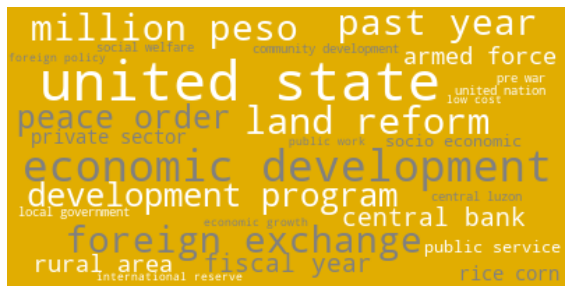

In [22]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.colors

data = rank.set_index('term').to_dict()['rank']
CustomCmap = matplotlib.colors.ListedColormap(['#FFFFFF', '#808080'])
wordcloud = WordCloud(background_color="#E1AD01", min_font_size=8, colormap=CustomCmap,
                          prefer_horizontal=1).generate_from_frequencies(frequencies=data)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
#plt.set_title(str(df_excel.columns[i]), fontsize=16)
plt.axis("off")

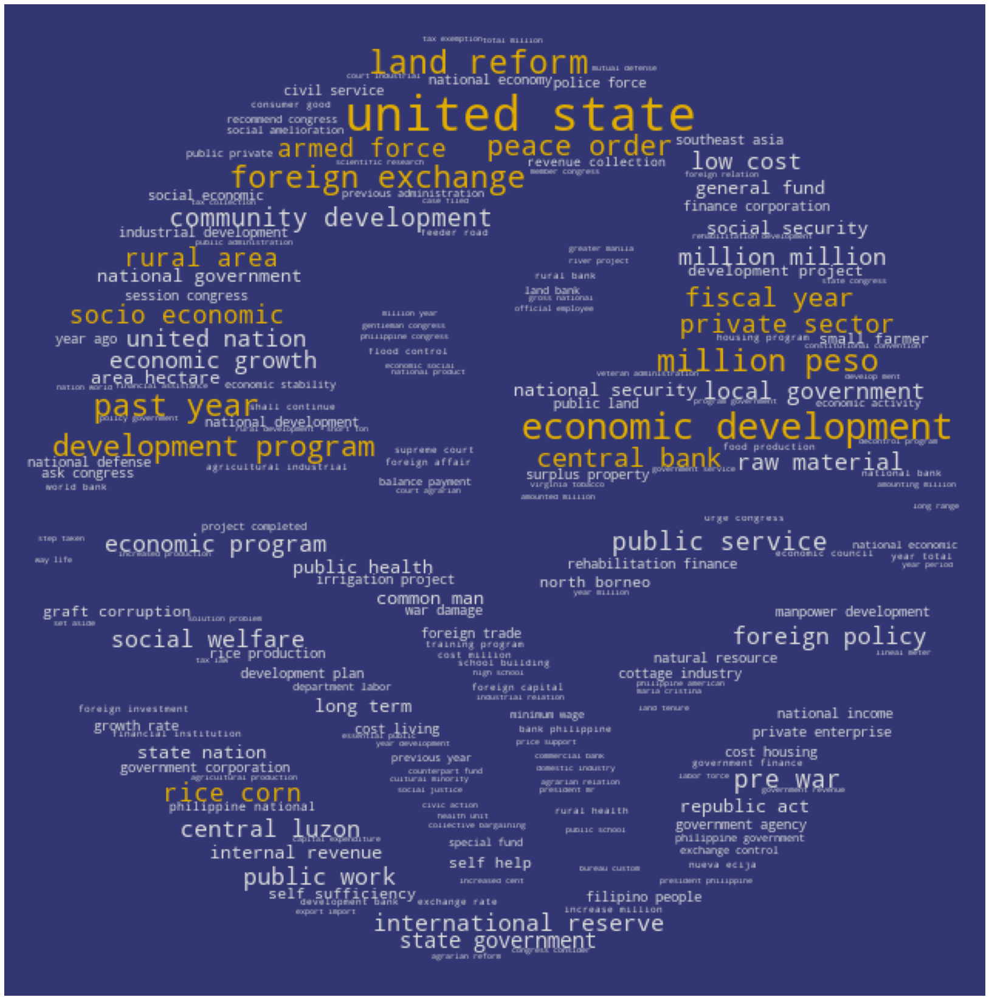

In [23]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("Development.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      collocations=False,
                      prefer_horizontal=1,
                      background_color='#323672',
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_developing.jpg', bbox_inches='tight',pad_inches = 0)

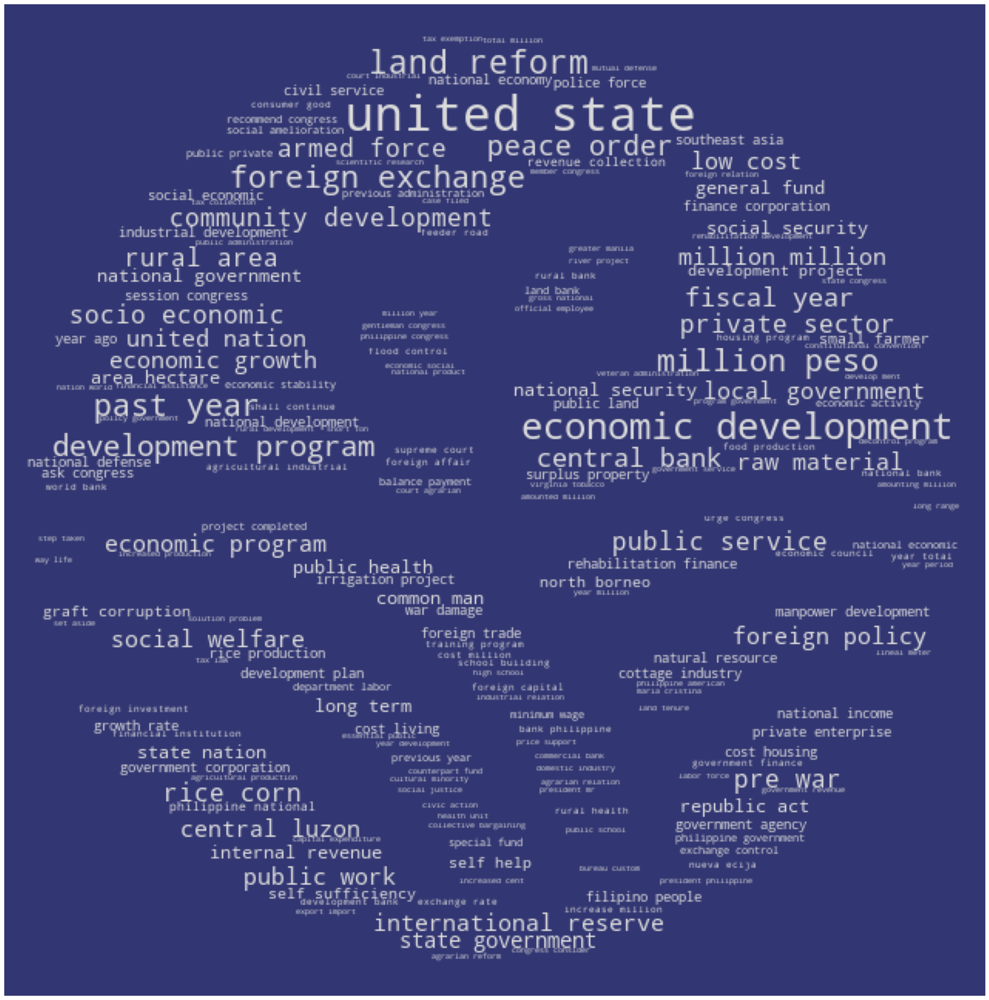

In [24]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

mask = np.array(Image.open("Development.png"))[:,:,3]
def transform_zeros(val):
    if val == 255:
        return 0
    else:
        return 255
    
maskable_image = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)
for i in range(len(mask)):
    maskable_image[i] = list(map(transform_zeros, mask[i]))
    
wordcloud = WordCloud(random_state=1,
                      collocations=False,
                      prefer_horizontal=1,
                      background_color='#323672',
                      mask=maskable_image).generate_from_frequencies(frequencies=data)
wordcloud = wordcloud.recolor(color_func=MyColorFunctor2(data, rank.iloc[14]['rank']),
                              random_state=3)

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
plot_cloud(wordcloud)
plt.savefig('wc_developing2.jpg', bbox_inches='tight',pad_inches = 0)

In [25]:
svd_cl4 = TruncatedSVD(n_components=83)
svd_cl4.fit(tfidf_cl4)
svd_cl4_results = svd_cl4.fit_transform(tfidf_cl4)
ve_cl4 = svd_cl4.explained_variance_ratio_
len(ve_cl4.cumsum() < 1)

svd_cl4 = TruncatedSVD(n_components=len(ve_cl4.cumsum() < 1))
svd_cl4.fit(tfidf_cl4)
svd_cl4_results = svd_cl4.fit_transform(tfidf_cl4)
ve_cl4 = svd_cl4.explained_variance_ratio_

df_tags = pd.DataFrame()
d_all = {}
for i, comp in enumerate(svd_cl4.components_):   
    best_features = [(feature_cl4[n], np.abs(svd_cl4.components_[i][n]))
                 for n in np.abs(svd_cl4.components_[i].argsort())[::-1]] 
    d_ = {}
    d_["SV_"+str(i)] = best_features  
    d_all.update(d_)

df_tags = df_tags.from_dict(d_all)
df_tags.head(10)

,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
0,"(united state, 0.21207283718626543)","(united state, 0.2256824267662885)","(economic development, 0.07148444634599338)","(million peso, 0.0679805582927599)","(socio economic, 0.13199678571732062)","(social amelioration, 0.04389066567022086)","(short ton, 0.04016014713625307)","(short ton, 0.06997828409949898)","(tax program, 0.04285968412955011)","(short ton, 0.03816525621910921)",...,"(cost living, 0.04373050898833007)","(socio economic, 0.036089829346077976)","(floating rate, 0.04052479208299178)","(leaving backlog, 0.06056241313363444)","(foreign exchange, 0.04085812203018177)","(north borneo, 0.10966738141208401)","(rate population, 0.036106891276766855)","(agrarian reform, 0.05648189424102816)","(surplus property, 0.07769333866488702)","(new filipinism, 0.07818787929242343)"
1,"(economic development, 0.12254215500208124)","(million peso, 0.10440923570284366)","(socio economic, 0.05360645369122246)","(river project, 0.04253077208767302)","(north borneo, 0.10815213169036772)","(short ton, 0.041625611135738844)","(board foot, 0.03903660861863922)","(board foot, 0.06864961405043751)","(improvement people, 0.03603785217275754)","(board foot, 0.03698459348545579)",...,"(shall able, 0.038087805566185434)","(national society, 0.0340917813251589)","(national manpower, 0.03296320243273219)","(backlog case, 0.051975126928232813)","(billion million, 0.03689252903441117)","(amendment r, 0.04325848247995723)","(trade zone, 0.03201335135051085)","(development plan, 0.048760346771553935)","(session congress, 0.0717036896733786)","(ice plant, 0.05244835912205171)"
2,"(land reform, 0.10904526869008876)","(pre war, 0.09527189278701648)","(foreign exchange, 0.04559147358866336)","(self help, 0.03643788347454837)","(economic program, 0.07422786356849946)","(board foot, 0.04132915581304401)","(rehabilitation development, 0.038620101920905...","(pre war, 0.0627812259830801)","(health citizenry, 0.03603785217275754)","(new tariff, 0.03522978660531366)",...,"(sinking fund, 0.03756588496449242)","(leaving backlog, 0.033069974860227426)","(world bank, 0.0324965539911191)","(case leaving, 0.0432588665240246)","(exchange import, 0.029132281040076185)","(lower price, 0.03303362390708975)","(welfare program, 0.031906333448731394)","(year development, 0.04660949027999787)","(military police, 0.04771655182468897)","(ordered dismissal, 0.052125252861615616)"
3,"(foreign exchange, 0.0884438940382999)","(surplus property, 0.06888043140545269)","(international reserve, 0.04470869682911897)","(recommend congress, 0.03152365388322547)","(economic growth, 0.0692593458716838)","(public health, 0.03822217195710175)","(public work, 0.036974027361216716)","(million peso, 0.04784206731179846)","(implemen tation, 0.03603785217275754)","(land reform, 0.034591149075891434)",...,"(law amending, 0.033132919173628005)","(rule law, 0.02982528768333574)","(department labor, 0.030349507893984773)","(filed disposed, 0.0432588665240246)","(metallurgical industry, 0.028022228035815083)","(claim north, 0.030898916057112317)","(crime rate, 0.030736743284663342)","(privilege writ, 0.042294571955235456)","(past month, 0.046847502933697875)","(metropolitan area, 0.04745784301862726)"
4,"(past year, 0.08155356853668728)","(state government, 0.05866355276774199)","(common man, 0.039376895557115044)","(small farmer, 0.031172358378445092)","(common man, 0.04625995182712625)","(rehabilitation development, 0.03758137348024047)","(capital expenditure, 0.036928894430747254)","(troubled area, 0.039055922594011826)","(session called, 0.03603785217275754)","(project completed, 0.03333132441149903)",...,"(purchasing power, 0.03291143593150451)","(backlog case, 0.026902442071369777)","(youth council, 0.029773102030950037)","(north borneo, 0.041841381514813085)","(ton ton, 0.028022228035815083)","(central bank, 0.028186048271500355)","(international market, 0.028910883178229273)",

In [26]:
for col in df_tags:
    #print(col)
    #print(df_tags[col].dtype)
    print(col)
    display(df_tags[df_tags[col].astype(str).str.contains('corn')])
    print('#######################################################')

SV_0


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
13,"(rice corn, 0.055962966319986054)","(philippine veteran, 0.03386633552949906)","(essential consumer, 0.027894343768721405)","(total membership, 0.024735599210766877)","(lower price, 0.03348636267030614)","(irrigation project, 0.02783119727582206)","(direct government, 0.03255822150374874)","(ending june, 0.032273767314381106)","(philippine economy, 0.03052777931088556)","(special session, 0.024228593316184033)",...,"(pre war, 0.02490035514470631)","(internal revenue, 0.02141759832113268)","(firm offered, 0.02317387545407494)","(deficit financing, 0.025955319914414767)","(cultural exchange, 0.023814779498563407)","(exchange import, 0.021737289587925174)","(social welfare, 0.0247462541896307)","(public safety, 0.02819638130349029)","(present session, 0.02862993109481338)","(barrio high, 0.03257828303850977)"
371,"(corn production, 0.01464997564270996)","(management labor, 0.010495616526025311)","(private organization, 0.010753760425473926)","(increased metric, 0.010585023122180081)","(possible time, 0.011936685555694701)","(material needed, 0.011522454035652269)","(world friend, 0.017218201293971273)","(corporation opening, 0.017162403512609378)","(improve social, 0.01801892608637877)","(life mainly, 0.011743262201771224)",...,"(gross national, 0.01055729164564066)","(diplomatic level, 0.009448564245779266)","(bonded debt, 0.00992525519076597)","(corruption government, 0.008945134761386529)","(condition drag, 0.009340742678605032)","(state america, 0.00962765900273876)","(trade unionism, 0.010072631504345987)","(increased price, 0.011846258472140282)","(committed furtherance, 0.009543310364937798)","(suspended month, 0.013031313215403904)"
1008,"(corn administration, 0.009363963289775002)","(bank expect, 0.007366754771949696)","(material new, 0.007400670261439742)","(revenue discover, 0.008477282719250993)","(energy imagination, 0.006426482701044057)","(country able, 0.011522454035652269)","(compromise entertained, 0.017218201293971273)","(road highway, 0.013054086632490962)","(responsibility execution, 0.01801892608637877)","(recast educational, 0.011743262201771224)",...,"(january arrears, 0.008283229793407001)","(mainly concerned, 0.006606692051114038)","(security established, 0.006585710036086637)","(direct social, 0.008651773304804922)","(carry inflationary, 0.009340742678605032)","(term acquisition, 0.006325410296425018)","(regard provision, 0.006402670270102168)","(good vital, 0.007049095325872573)","(concurred exact, 0.009543310364937798)","(processing equipment, 0.006515656607701952)"
2411,"(corn program, 0.006271567432109434)","(force patrol, 0.005311740427946769)","(inconsistent objective, 0.006221631929646579)","(transportation proper, 0.007288030045526854)","(people bolster, 0.006426482701044057)","(area spread, 0.009188423527814954)","(increasing export, 0.008692468833173298)","(relieve people, 0.00843552328087352)","(politics dictated, 0.0034560125285631946)","(wealth health, 0.009246148371363947)",...,"(m figure, 0.008283229793407001)","(livestock million, 0.006606692051114038)","(pioneer certain, 0.005793468863518735)","(reserve away, 0.008651773304804922)","(bank credit, 0.008332343263993515)","(ago partner, 0.006325410296425018)","(reduction importation, 0.006402670270102168)","(preference philippine, 0.007049095325872573)","(landowner relationship, 0.009543310364937798)","(threat good, 0.006515656607701952)"
2931,"(corn surplus, 0.005755873734133819)","(national neutral, 0.005311740427946769)","(balanced agricultural, 0.006221631929646579)","(nearly doubled, 0.007288030045526854)","(adhering firmly, 0.006426482701044057)","(force republic, 0.008843588316178888)","(revolutionary impetus, 0.0047085064749555075)","(fund facilitate, 0.00843552328087352)","(installed help, 0.0034560125285631946)","(physical target, 0.007877473385968961)",...,"(commitment gratifying, 0.008283229793407001)","(corn t

#######################################################
SV_1


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
696,"(dollar reserve, 0.011098398145464214)","(corn corporation, 0.008936091577396119)","(gradually developing, 0.008510876218455612)","(various budgetary, 0.008477282719250993)","(plan activity, 0.008599604195711232)","(copra lumber, 0.011522454035652269)","(strengthen defense, 0.017218201293971273)","(prevent situation, 0.017162403512609378)","(severe measure, 0.01801892608637877)","(length road, 0.011743262201771224)",...,"(controlled deflationary, 0.008283229793407001)","(state university, 0.0071661670117327695)","(reform tax, 0.008126406841563285)","(overstating chinese, 0.008651773304804922)","(peso went, 0.009340742678605032)","(pave way, 0.006997871092444302)","(democratic government, 0.0074947637392449775)","(second class, 0.007508078797316023)","(cooperation year, 0.009543310364937798)","(fishery commission, 0.008128298623337152)"
934,"(construction improvement, 0.009703691830634173)","(corn project, 0.007741686802959714)","(depriving government, 0.007675674478382354)","(private gain, 0.008477282719250993)","(essential commodity, 0.006619180492647379)","(cause innocent, 0.011522454035652269)","(plan theoretically, 0.017218201293971273)","(improved industrial, 0.014675731792823625)","(happy passed, 0.01801892608637877)","(realizing created, 0.011743262201771224)",...,"(submitting separate, 0.008283229793407001)","(gsis sold, 0.006606692051114038)","(envisioned condition, 0.006737927160056011)","(pay dividend, 0.008651773304804922)","(pcac served, 0.009340742678605032)","(ownership ensure, 0.006325410296425018)","(ilocos norte, 0.006759989564610057)","(drag development, 0.007049095325872573)","(refrigerator ship, 0.009543310364937798)","(combined resource, 0.006515656607701952)"
1448,"(philippine product, 0.00795806353408909)","(crisis corn, 0.005923553884450232)","(exercise meaning, 0.006221631929646579)","(created purportedly, 0.008477282719250993)","(shall coordinate, 0.006426482701044057)","(session second, 0.011056066721740494)","(need increase, 0.01196597018176782)","(age seeking, 0.00843552328087352)","(million peso, 0.012429812111270927)","(english local, 0.011743262201771224)",...,"(site capitol, 0.008283229793407001)","(foregoing ask, 0.006606692051114038)","(saw armed, 0.005793468863518735)","(nucleus armed, 0.008651773304804922)","(false ideology, 0.009340742678605032)","(control ideal, 0.006325410296425018)","(likened corporation, 0.006402670270102168)","(duty time, 0.007049095325872573)","(ahead pressing, 0.009543310364937798)","(frustration resignation, 0.006515656607701952)"
2356,"(le fortunate, 0.006333531842787997)","(corn cereal, 0.005311740427946769)","(respect people, 0.006221631929646579)","(defense america, 0.007288030045526854)","(need rely, 0.006426482701044057)","(june year, 0.00987527127886879)","(artesian barrio, 0.009417012949911015)","(record establishment, 0.00843552328087352)","(form reduced, 0.0034560125285631946)","(operation centrifugal, 0.009246148371363947)",...,"(careful estimating, 0.008283229793407001)","(author sponsor, 0.006606692051114038)","(trade moral, 0.005793468863518735)","(build multi, 0.008651773304804922)","(fishery development, 0.008617377142156896)","(prey deceptive, 0.006325410296425018)","(outmoded institution, 0.006402670270102168)","(grew estimated, 0.007049095325872573)","(know good, 0.009543310364937798)","(came saving, 0.006515656607701952)"
2376,"(social unrest, 0.006313749942682366)","(corn root, 0.005311740427946769)","(enact appropriate, 0.006221631929646579)","(useful successful, 0.007288030045526854)","(enact new, 0.006426482701044057)","(room improvement, 0.009641825919730467)","(margin levy, 0.009153908340493691)","(medical discovery, 0.00843552328087352)","(free nagging, 0.0034560125285631946)","(place inspired, 0.009246148371363947)",...,"(lowering price, 0.008283229793407001)","(assistance case, 0.006606692051114038)","(pound world, 0.

#######################################################
SV_2


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
201,"(nation building, 0.01835962955149818)","(creation central, 0.01283894461372279)","(rice corn, 0.013041007312582717)","(service people, 0.013211713767826193)","(ascertain impact, 0.012852965402088114)","(road bridge, 0.013927044894885872)","(left uncultivated, 0.017218201293971273)","(remains maintain, 0.017162403512609378)","(force cause, 0.01801892608637877)","(tenure time, 0.011743262201771224)",...,"(welfare program, 0.012721284712489305)","(anti smuggling, 0.01195975595355409)","(today great, 0.01158693772703747)","(desire improve, 0.010597879706478169)","(efficiency government, 0.01085766008890281)","(borneo malaya, 0.012359566422844928)","(importation raw, 0.012805340540204336)","(tourist plant, 0.014098190651745146)","(earliest possible, 0.012963327425610554)","(omnibus amendment, 0.013031313215403904)"
4042,"(national abaca, 0.004969765348676839)","(enterprise demand, 0.005311740427946769)","(corn expansion, 0.005912187483105563)","(new waterworks, 0.006548508247464138)","(intensification custom, 0.006405271098981789)","(operation economic, 0.008843588316178888)","(general upward, 0.0047085064749555075)","(communist led, 0.0030083553084186317)","(people substantial, 0.002663974771995291)","(appropriation total, 0.006730913542618931)",...,"(sufficient rice, 0.006524289333529468)","(steadily increased, 0.006606692051114038)","(review realistic, 0.005793468863518735)","(shall release, 0.004637885596381508)","(planning intelligent, 0.005868629518953266)","(pre decontrol, 0.006179783211422464)","(candidate national, 0.006402670270102168)","(technique enactment, 0.007049095325872573)","(originally contemplated, 0.009543310364937798)","(effort involved, 0.006515656607701952)"
5128,"(form loan, 0.004492780812589527)","(area unrest, 0.005311740427946769)","(corn program, 0.005337359633928678)","(adoption educational, 0.00621822353662235)","(convention amend, 0.006405271098981789)","(palay corn, 0.007290916335578772)","(essential service, 0.004614064877887361)","(cayetano arellano, 0.002631577173406019)","(giving position, 0.002663974771995291)","(store distribute, 0.0039387366929844805)",...,"(largely form, 0.005709555109295833)","(extending short, 0.006366372484380953)","(concluding study, 0.005793468863518735)","(coordination existing, 0.0031510853310651034)","(bear danger, 0.004308688571078448)","(long known, 0.006179783211422464)","(program reduce, 0.006402670270102168)","(certificate union, 0.007049095325872573)","(manpower youth, 0.003347770298727095)","(dollar channel, 0.006515656607701952)"
7228,"(portion proceeds, 0.0038030646653360767)","(established effective, 0.00494431328080323)","(corn feed, 0.0049948288037088)","(number indicating, 0.004763160361811961)","(basic require, 0.006405271098981789)","(need continually, 0.005388652720696257)","(rising dollar, 0.0025657025815178686)","(hand urge, 0.002631577173406019)","(ernmental policy, 0.0017331296621650167)","(saw restriction, 0.0039387366929844805)",...,"(materially increased, 0.00537623352958262)","(financing report, 0.004724282122889633)","(metropolitan center, 0.004962627595382985)","(people program, 0.0028645964720951226)","(cambodia indonesia, 0.004308688571078448)","(exploitation rank, 0.006179783211422464)","(november financed, 0.006402670270102168)","(monitoring planning, 0.007049095325872573)","(squarely great, 0.0013873652872553395)","(manila accord, 0.006515656607701952)"
7229,"(export continued, 0.0038030646653360767)","(function possible, 0.00494431328080323)","(corn fish, 0.0049948288037088)","(indicating great, 0.004763160361811961)","(basic reason, 0.006405271098981789)","(solution quick, 0.005388652720696257)","(encouraging establishment, 0.0025657025815178...","(trusteeship council, 0.002631577173406019)","(producing commodity, 0.0017331296621650167)","(administration sell, 0.0039387366929844805)",...,"(government ordinary, 0.005

#######################################################
SV_3


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
4404,"(telegraph station, 0.004824700503683447)","(labor come, 0.005311740427946769)","(support credit, 0.005912187483105563)","(corn expansion, 0.00621822353662235)","(level compared, 0.006405271098981789)","(wish solemn, 0.008843588316178888)","(latest figure, 0.0047085064749555075)","(bond sold, 0.002631577173406019)","(aside eradicate, 0.002663974771995291)","(reform area, 0.00582139311884172)",...,"(afternoon paper, 0.005709555109295833)","(fishpond application, 0.006606692051114038)","(strengthen present, 0.005793468863518735)","(million small, 0.0039057556204433875)","(fiscal rehabilitation, 0.004789124760277055)","(service pause, 0.006179783211422464)","(settlement aid, 0.006402670270102168)","(fully assist, 0.007049095325872573)","(diplomatic representative, 0.008700405333351934)","(crushed backbone, 0.006515656607701952)"
5627,"(develop new, 0.00425632276428526)","(neutral country, 0.005311740427946769)","(level morality, 0.0049948288037088)","(corn project, 0.006018649528856436)","(founding republic, 0.006405271098981789)","(developmental investment, 0.005388652720696257)","(expand government, 0.003655952990063688)","(administered treatment, 0.002631577173406019)","(epidemic large, 0.002663974771995291)","(special urgency, 0.0039387366929844805)",...,"(expected period, 0.005709555109295833)","(appropriation scientific, 0.0053009727234952855)","(safeguard government, 0.005793468863518735)","(endanger stability, 0.0031510853310651034)","(just laborer, 0.004308688571078448)","(opportunity brought, 0.006179783211422464)","(industrial establishment, 0.006402670270102168)","(link cooperative, 0.007049095325872573)","(people fulfilled, 0.0017293222141719251)","(ranking government, 0.006515656607701952)"
8016,"(relationship country, 0.0036941494960936344)","(operation propose, 0.00494431328080323)","(bulk year, 0.0049948288037088)","(palay corn, 0.004666299957852989)","(allegation political, 0.006405271098981789)","(simply certain, 0.003631333172601209)","(cacao citrus, 0.0025657025815178686)","(intensified better, 0.0020907396178174898)","(period meantime, 0.0017331296621650167)","(continuing development, 0.0039387366929844805)",...,"(anticrime drive, 0.003889328346805628)","(production corn, 0.004724282122889633)","(provide educational, 0.004962627595382985)","(aware important, 0.002362436154559147)","(saw qualified, 0.004308688571078448)","(bell trade, 0.004652761945577437)","(year filipino, 0.006093205788966957)","(past currency, 0.007049095325872573)","(peso wage, 0.0013873652872553395)","(unequivocally upheld, 0.006515656607701952)"
8625,"(economic project, 0.0035666832162251625)","(coconut land, 0.00494431328080323)","(essential need, 0.004225560654700635)","(crisis corn, 0.004632565400788301)","(judicial independence, 0.005232938110131511)","(price quality, 0.003631333172601209)","(benefit consolidated, 0.0025657025815178686)","(force g, 0.0020907396178174898)","(consumer need, 0.0017331296621650167)","(work release, 0.0039387366929844805)",...,"(support representative, 0.00385398527366508)","(definitely devaluation, 0.004724282122889633)","(food rationed, 0.004962627595382985)","(ment cooperation, 0.002318942798190754)","(production accompanied, 0.004308688571078448)","(year lifted, 0.003749091031616517)","(buoyancy price, 0.004649128176791064)","(involve borderline, 0.007049095325872573)","(pledge lower, 0.0011277709920142387)","(alien determined, 0.006515656607701952)"
8841,"(espe cially, 0.003539240358620359)","(measure decentralization, 0.00494431328080323)","(plan effect, 0.003999518685750453)","(corn production, 0.004513670769420219)","(commu nity, 0.00510257496275569)","(semestral class, 0.003631333172601209)","(greater measure, 0.0025571416637026395)","(annually long, 0.0020907396178174898)","(vii efficient, 0.0017331296621650167)","(department office, 0.0039387366929844805)",...,"(ample workin

#######################################################
SV_4


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
10,"(central bank, 0.061917430891043276)","(veteran administration, 0.03820634651738881)","(small farmer, 0.030798420521200704)","(public land, 0.02544087372210056)","(rice corn, 0.034381312441919325)","(gov ernment, 0.032193254438474955)","(government official, 0.033769691336131676)","(operation war, 0.034324807025218756)","(share world, 0.03603785217275754)","(congress consider, 0.025299440640642264)",...,"(million peso, 0.02646578374599592)","(case filed, 0.02242630140925365)","(democratic revolution, 0.024220223935777416)","(backpay sinking, 0.025955319914414767)","(import control, 0.02559763975052856)","(essential consumer, 0.024444251281993228)","(central bank, 0.02538869705169548)","(fiscal year, 0.03229538463649601)","(strike government, 0.02862993109481338)","(youth student, 0.03409611602269442)"
111,"(year million, 0.024537130394811524)","(war level, 0.0156336300842771)","(congress consider, 0.016014502354289088)","(essential condition, 0.014576060091053708)","(corn program, 0.015625728638866337)","(grow flourish, 0.017687176632357776)","(welfare private, 0.017218201293971273)","(government disbursed, 0.017162403512609378)","(communist menace, 0.01801892608637877)","(project irrigation, 0.014159885711284523)",...,"(passenger freight, 0.016566459586814002)","(improvement kilometer, 0.013213384102228077)","(growth target, 0.01346853388373569)","(need economic, 0.01645355329428508)","(exchange control, 0.013469644611877067)","(chute project, 0.012650820592850037)","(context new, 0.012805340540204336)","(electric service, 0.015551414668086551)","(state process, 0.019086620729875596)","(agricultural productivity, 0.016498012225817572)"
382,"(employment opportunity, 0.014456112766387901)","(adequate fund, 0.010280256119838124)","(wage position, 0.010753760425473926)","(nearing completion, 0.01048810566379807)","(corn administration, 0.011537016637012515)","(welfare commission, 0.011522454035652269)","(financing possible, 0.017218201293971273)","(total school, 0.017162403512609378)","(helped major, 0.01801892608637877)","(bank rfc, 0.011743262201771224)",...,"(government expenditure, 0.010360876918121912)","(certificate tax, 0.009448564245779266)","(figure year, 0.00992525519076597)","(revenue new, 0.008799407767189255)","(unit completed, 0.009340742678605032)","(rural area, 0.009468708559834492)","(country especially, 0.009863658687250892)","(leaving backlog, 0.01168105967089435)","(reorganizing reestablishing, 0.00954331036493...","(new type, 0.013031313215403904)"
720,"(state philippine, 0.010906537512747337)","(great privilege, 0.008936091577396119)","(calculated risk, 0.00841194440594868)","(mission contributing, 0.008477282719250993)","(corn authority, 0.008599604195711232)","(leading financial, 0.011522454035652269)","(study feasibility, 0.017218201293971273)","(pull promotion, 0.017162403512609378)","(casualty present, 0.01801892608637877)","(responsibility fully, 0.011743262201771224)",...,"(development appeal, 0.008283229793407001)","(area constrained, 0.00696891769313517)","(productivity land, 0.008006682526396747)","(personal effect, 0.008651773304804922)","(premise freedom, 0.009340742678605032)","(growth economy, 0.00693385805217081)","(loan million, 0.007322818632247412)","(country progress, 0.007475207694296771)","(quest power, 0.009543310364937798)","(capital city, 0.0076215658216295425)"
1676,"(provide mean, 0.007409517238715128)","(cause industrial, 0.005923553884450232)","(far gone, 0.006221631929646579)","(democracy come, 0.008477282719250993)","(corn shall, 0.006426482701044057)","(industry recuperated, 0.010332288953261003)","(legation buenos, 0.009759152154659804)","(corporation directing, 0.00843552328087352)","(country shall, 0.005302468500286943)","(developing effective, 0.010913116513326139)",...,"(undergo acute, 0.008283229793407001)","(conference ecafe, 0.006606692051114038)","(unf

#######################################################
SV_5


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
250,"(capital expenditure, 0.016815983161902852)","(tenant landowner, 0.011612790191186776)","(cent ton, 0.012443263859293159)","(labor service, 0.0124364470732447)","(market force, 0.012852965402088114)","(corn project, 0.012375447656288322)","(installed help, 0.017218201293971273)","(industry recuperated, 0.017162403512609378)","(aim correct, 0.01801892608637877)","(h club, 0.011743262201771224)",...,"(philippine today, 0.011800327276205256)","(school student, 0.010493455395608312)","(imported rice, 0.01158693772703747)","(court court, 0.00992486416563892)","(subject people, 0.010065407247904754)","(encourage local, 0.011755625856625082)","(generate fund, 0.012805340540204336)","(program dbp, 0.014098190651745146)","(rent control, 0.009543310364937798)","(year help, 0.013031313215403904)"
1876,"(presidential action, 0.007030023617224157)","(contribution capital, 0.005923553884450232)","(principally marikina, 0.006221631929646579)","(peace order, 0.0074514807856769175)","(tually wiped, 0.006426482701044057)","(crisis corn, 0.010332288953261003)","(spite unfavorable, 0.009759152154659804)","(negotiation international, 0.00843552328087352)","(exchange reserve, 0.003879609138603533)","(hard work, 0.009328108780534573)",...,"(today glad, 0.008283229793407001)","(liquor cigarette, 0.006606692051114038)","(consistent spirit, 0.005793468863518735)","(reduced morbidity, 0.008651773304804922)","(issue constant, 0.009340742678605032)","(purchase redistribution, 0.006325410296425018)","(issuance tax, 0.006402670270102168)","(hidden underemployment, 0.007049095325872573)","(called reconsider, 0.009543310364937798)","(program quicken, 0.006515656607701952)"
2620,"(ecija tarlac, 0.006050604336412427)","(expectable income, 0.005311740427946769)","(addition rural, 0.006221631929646579)","(sufficient provide, 0.007288030045526854)","(directed secretary, 0.006426482701044057)","(sugar corn, 0.008843588316178888)","(philippine charity, 0.006446865477156853)","(allocate fair, 0.00843552328087352)","(eager contribute, 0.0034560125285631946)","(control organized, 0.009246148371363947)",...,"(liberty cherish, 0.008283229793407001)","(developmental endeavor, 0.006606692051114038)","(like pilgrimage, 0.005793468863518735)","(static longer, 0.008651773304804922)","(legislative measure, 0.007539834655515322)","(accordingly faith, 0.006325410296425018)","(law session, 0.006402670270102168)","(poured money, 0.007049095325872573)","(accomplish reorganization, 0.009543310364937798)","(plant steel, 0.006515656607701952)"
2959,"(need increase, 0.005717644361267702)","(step prevent, 0.005311740427946769)","(authority assurance, 0.006221631929646579)","(labor leadership, 0.007288030045526854)","(guide program, 0.006426482701044057)","(corn rice, 0.008843588316178888)","(enactment pending, 0.0047085064749555075)","(shown increasing, 0.00843552328087352)","(integral industrial, 0.0034560125285631946)","(dramatic rise, 0.007802700389737409)",...,"(providing redemption, 0.008283229793407001)","(receipt totaled, 0.006606692051114038)","(agency service, 0.005793468863518735)","(press focus, 0.008651773304804922)","(failure mean, 0.0059272030461161975)","(terest national, 0.006179783211422464)","(sacrifice larger, 0.006402670270102168)","(suit local, 0.007049095325872573)","(groups caned, 0.009543310364937798)","(grown bad, 0.006515656607701952)"
5128,"(form loan, 0.004492780812589527)","(area unrest, 0.005311740427946769)","(corn program, 0.005337359633928678)","(adoption educational, 0.00621822353662235)","(convention amend, 0.006405271098981789)","(palay corn, 0.007290916335578772)","(essential service, 0.004614064877887361)","(cayetano arellano, 0.002631577173406019)","(giving position, 0.002663974771995291)","(store distribute, 0.0039387366929844805)",...,"(largely form, 0.005709555109295833)","(extending short, 0.006366372484380953)","(concluding s

#######################################################
SV_6


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
24,"(million million, 0.042660560949063446)","(building material, 0.02608866139118986)","(decontrol program, 0.025130804699354505)","(collective defense, 0.02186409013658055)","(foreign capital, 0.02795892331797459)","(minimum wage, 0.023805059762743212)","(rice corn, 0.024578578333623948)","(direct government, 0.023846258085402913)","(special session, 0.022294437290276064)","(shall presently, 0.023486524403542448)",...,"(local government, 0.023597580737813605)","(cent previous, 0.019820076153342116)","(public private, 0.020345631971707637)","(friend ally, 0.020902273423639626)","(irrigation covering, 0.018681485357210065)","(philippine cultural, 0.018976230889275053)","(south cotabato, 0.019253525458166595)","(police organization, 0.02434096929189989)","(government entity, 0.025134734808852775)","(national bridge, 0.026062626430807808)"
1543,"(government machinery, 0.0077420714510398414)","(total school, 0.005923553884450232)","(guided main, 0.006221631929646579)","(construction needed, 0.008477282719250993)","(feature year, 0.006426482701044057)","(national structure, 0.010332288953261003)","(corn surplus, 0.010148281752720907)","(cereal let, 0.00843552328087352)","(family planning, 0.008367978629597853)","(define objective, 0.011743262201771224)",...,"(creasing volume, 0.008283229793407001)","(believe outstanding, 0.006606692051114038)","(burden government, 0.005793468863518735)","(forthwith recommendation, 0.008651773304804922)","(law inconsistent, 0.009340742678605032)","(cooperative movement, 0.006325410296425018)","(completely terminating, 0.006402670270102168)","(gnp real, 0.007049095325872573)","(unit hiding, 0.009543310364937798)","(stock bond, 0.006515656607701952)"
2085,"(capital requirement, 0.006706065328489937)","(implemented plan, 0.005923553884450232)","(salutary influence, 0.006221631929646579)","(reducing operating, 0.007288030045526854)","(construction apartment, 0.006426482701044057)","(calcutta consulate, 0.010332288953261003)","(crisis corn, 0.009759152154659804)","(resourcefulness secure, 0.00843552328087352)","(vital internal, 0.0034560125285631946)","(share bank, 0.009246148371363947)",...,"(peso collected, 0.008283229793407001)","(given self, 0.006606692051114038)","(unless reflected, 0.005793468863518735)","(usual credit, 0.008651773304804922)","(year exchange, 0.009340742678605032)","(available recent, 0.006325410296425018)","(reference refund, 0.006402670270102168)","(tribe zambales, 0.007049095325872573)","(vessel transoceanic, 0.009543310364937798)","(fund earnings, 0.006515656607701952)"
2321,"(year operation, 0.006388725941135474)","(force difficult, 0.005311740427946769)","(peso went, 0.006221631929646579)","(dishonesty pledged, 0.007288030045526854)","(duration economic, 0.006426482701044057)","(heroic task, 0.010208325543182338)","(corn project, 0.00948112790531863)","(cash loan, 0.00843552328087352)","(encourage effort, 0.0034560125285631946)","(circumstance control, 0.009246148371363947)",...,"(peacefully secured, 0.008283229793407001)","(auspex emergency, 0.006606692051114038)","(country larger, 0.005793468863518735)","(branch especially, 0.008651773304804922)","(breeding service, 0.008617377142156896)","(engaged new, 0.006325410296425018)","(financing present, 0.006402670270102168)","(group deeply, 0.007049095325872573)","(lighterage warehouse, 0.009543310364937798)","(practical aspect, 0.006515656607701952)"
2548,"(school population, 0.006110753448700862)","(food critical, 0.005311740427946769)","(right shall, 0.006221631929646579)","(amounting december, 0.007288030045526854)","(decontrol generated, 0.006426482701044057)","(epic fight, 0.008843588316178888)","(corn production, 0.007128591514430179)","(source university, 0.00843552328087352)","(easily understood, 0.0034560125285631946)","(effort drastic, 0.009246148371363947)",...,"(liberty recommending, 0.00828322979340700

#######################################################
SV_7


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
704,"(standard people, 0.011025357963626874)","(maintaining small, 0.008936091577396119)","(strengthened national, 0.008510876218455612)","(needed accommodate, 0.008477282719250993)","(rca namarco, 0.008599604195711232)","(pending minimum, 0.011522454035652269)","(taken granted, 0.017218201293971273)","(crisis corn, 0.017162403512609378)","(portion saving, 0.01801892608637877)","(responsibility produce, 0.011743262201771224)",...,"(strength men, 0.008283229793407001)","(widow orphan, 0.007077916054926098)","(higher rate, 0.008120328814926959)","(telecommunication project, 0.008651773304804922)","(policy nullify, 0.009340742678605032)","(did act, 0.006968593149400386)","(service commission, 0.007482399854434351)","(economic undertaking, 0.007508078797316023)","(cooperation admiral, 0.009543310364937798)","(department labor, 0.00784642014505557)"
1006,"(directed department, 0.009372460830069804)","(conserve dollar, 0.007366754771949696)","(industry registered, 0.007400670261439742)","(armed conflict, 0.008477282719250993)","(bear speculator, 0.006426482701044057)","(vival arm, 0.011522454035652269)","(busy exploring, 0.017218201293971273)","(corn project, 0.013063956750407781)","(insure stability, 0.01801892608637877)","(facoma marketing, 0.011743262201771224)",...,"(problem financing, 0.008283229793407001)","(based revised, 0.006606692051114038)","(rolling stock, 0.0065924526508395675)","(keeping proper, 0.008651773304804922)","(carefully properly, 0.009340742678605032)","(partial implementation, 0.006325410296425018)","(favorably classroom, 0.006402670270102168)","(good suitable, 0.007049095325872573)","(regarding proposal, 0.009543310364937798)","(granted commend, 0.006515656607701952)"
1046,"(mutual assistance, 0.009189437302957907)","(deal subject, 0.007173660175167089)","(rate economic, 0.007364321697292459)","(want protected, 0.008477282719250993)","(ensure bottle, 0.006426482701044057)","(increasing force, 0.011522454035652269)","(yield uglier, 0.017218201293971273)","(rice corn, 0.01165767119251919)","(burden able, 0.01801892608637877)","(commercial exploitation, 0.011743262201771224)",...,"(today trust, 0.008283229793407001)","(considering eventual, 0.006606692051114038)","(cash collection, 0.006315928439829998)","(manila outlying, 0.008651773304804922)","(house committee, 0.009340742678605032)","(strong democratic, 0.006325410296425018)","(limitation propaganda, 0.006402670270102168)","(government recognition, 0.007049095325872573)","(reason know, 0.009543310364937798)","(given unorganized, 0.006515656607701952)"
1075,"(philippine claim, 0.009057217507467229)","(permanent public, 0.007029631462923628)","(problem requirement, 0.007264131867540008)","(program send, 0.008477282719250993)","(necessitates adjustment, 0.006426482701044057)","(merging social, 0.011522454035652269)","(build strong, 0.017218201293971273)","(corn production, 0.010332201179833795)","(finance able, 0.01801892608637877)","(close new, 0.011743262201771224)",...,"(greater aid, 0.008283229793407001)","(dispersed loaned, 0.006606692051114038)","(cooperation assistance, 0.006315928439829998)","(modernization inter, 0.008651773304804922)","(essential strategic, 0.009340742678605032)","(earnest consideration, 0.006325410296425018)","(people pc, 0.006402670270102168)","(restructured provided, 0.007049095325872573)","(constitute answer, 0.009543310364937798)","(supply sacada, 0.006515656607701952)"
1680,"(purpose project, 0.007400181660692285)","(materially diminished, 0.005923553884450232)","(term acquisition, 0.006221631929646579)","(abaca eradicate, 0.008477282719250127)","(tary fund, 0.006426482701044057)","(industry record, 0.010332288953261003)","(measure productive, 0.009759152154659804)","(corn constitute, 0.00843552328087352)","(billion million, 0.005260919626509693)","(genuine democracy, 0.010913116513326139)",...,"(number filipino, 

#######################################################
SV_8


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
5184,"(world crisis, 0.004479795303174418)","(potential legislation, 0.005311740427946769)","(supply material, 0.005235276130698575)","(step created, 0.00621822353662235)","(merely place, 0.006405271098981789)","(independent farmer, 0.0071371419054161896)","(reparation transaction, 0.0044562303945422975)","(article export, 0.002631577173406019)","(corn hectare, 0.002663974771995291)","(effect bureaucracy, 0.0039387366929844805)",...,"(industry likely, 0.005709555109295833)","(construction airport, 0.0062922353810099625)","(improved business, 0.005793468863518735)","(national require, 0.0031510853310651034)","(subversion infiltration, 0.004308688571078448)","(pectation passage, 0.006179783211422464)","(adopted current, 0.006402670270102168)","(proposed meaning, 0.007049095325872573)","(banking sound, 0.002774730574510679)","(divided economically, 0.006515656607701952)"
5242,"(nation new, 0.004426862272129581)","(power expedite, 0.005311740427946769)","(field foreign, 0.00512305385075925)","(make private, 0.00621822353662235)","(nation prefers, 0.006405271098981789)","(congress urgent, 0.006815675571975663)","(agency office, 0.0043672148734354805)","(republic recently, 0.002631577173406019)","(corn constitute, 0.002663974771995291)","(question tended, 0.0039387366929844805)",...,"(dom common, 0.005709555109295833)","(program outlined, 0.006266808670171892)","(completed decision, 0.005793468863518735)","(credit increased, 0.0031510853310651034)","(intact compelling, 0.004308688571078448)","(participant bringing, 0.006179783211422464)","(context previous, 0.006402670270102168)","(legislating urgent, 0.007049095325872573)","(power people, 0.0025822776719825404)","(sector utilize, 0.006515656607701952)"
8812,"(operation law, 0.0035412452019975673)","(occur judge, 0.00494431328080323)","(abolish tenancy, 0.004009500365088626)","(available small, 0.004575904446626247)","(farm settlement, 0.005108536623085006)","(retrospect government, 0.003631333172601209)","(mass action, 0.0025657025815178686)","(subjected thorough, 0.0020907396178174898)","(corn feed, 0.0017331296621650167)","(labor business, 0.0039387366929844805)",...,"(alien dictatorship, 0.00385398527366508)","(million cavans, 0.004475124341057573)","(country battlefield, 0.004962627595382985)","(confidence sense, 0.002318942798190754)","(constant review, 0.004297205073109525)","(surrender new, 0.0035667551630162546)","(capability crime, 0.004510739363991743)","(measure provide, 0.006493312838247116)","(wealthy fight, 0.0010755469202708696)","(adverse movement, 0.006515656607701952)"
8830,"(commission graft, 0.0035406237250219554)","(official language, 0.00494431328080323)","(popular good, 0.004009500365088626)","(government order, 0.004544634790064695)","(activity alien, 0.00510257496275569)","(completed mariveles, 0.003631333172601209)","(necessary furthermore, 0.0025657025815178686)","(subject curriculum, 0.0020907396178174898)","(corn fish, 0.0017331296621650167)","(reduction central, 0.0039387366929844805)",...,"(advisability imposing, 0.00385398527366508)","(utilization abundant, 0.004423211005806937)","(shall forward, 0.004962627595382985)","(tragically make, 0.002318942798190754)","(tax law, 0.004265268792905342)","(loyal finance, 0.0035667551630162546)","(duty importation, 0.004510739363991743)","(special account, 0.006381364004795051)","(persistently compounded, 0.0010755469202708696)","(valued distributed, 0.006515656607701952)"
11116,"(proposal propose, 0.003307904019109852)","(hearing great, 0.004771143806584753)","(law adhere, 0.003837837239191177)","(philippine friendship, 0.002837455931332045)","(appointment individual, 0.004299802097855616)","(importation clearly, 0.0011673181081351598)","(catch growing, 0.0020336250841622196)","(russian chinese, 0.001247279590359006)","(corn sorghum, 0.0016690149749821203)","(congress establish, 0.00152092162553265

#######################################################
SV_9


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
150,"(economic council, 0.02137082689062277)","(able report, 0.014013757295790283)","(world disarmament, 0.014706742282550785)","(financed public, 0.013972220183770924)","(laborer wage, 0.013895459596508553)","(economic measure, 0.015514648212522603)","(landless filipino, 0.017218201293971273)","(definite progress, 0.017162403512609378)","(solidarity responsibility, 0.01801892608637877)","(rice corn, 0.01288461386644501)",...,"(fiscal rehabilitation, 0.015151844425617098)","(corn authority, 0.013213384102228077)","(national port, 0.012004367406916449)","(reparation agreement, 0.013253133689081906)","(likewise number, 0.012096991772335988)","(commodity stabilized, 0.012359566422844928)","(model project, 0.012805340540204336)","(national survey, 0.014098190651745146)","(government revenue, 0.01598924444272298)","(offshore military, 0.013031313215403904)"
788,"(balance trade, 0.010498513694492468)","(authorized guerrilla, 0.008610454333277884)","(costing million, 0.00807162385885798)","(le ask, 0.008477282719250993)","(growth development, 0.008171587128538447)","(appreciate earnest, 0.011522454035652269)","(man development, 0.017218201293971273)","(challenge authority, 0.017162403512609378)","(reaction suppressed, 0.01801892608637877)","(corn expansion, 0.011743262201771224)",...,"(second ganta, 0.008283229793407001)","(international conference, 0.006799552675018974)","(confidence government, 0.007481297402626992)","(contributed promoting, 0.008651773304804922)","(authority necessary, 0.009340742678605032)","(marking adjournment, 0.006892746016744472)","(previous administration, 0.006944300110312525)","(important original, 0.007049095325872573)","(program security, 0.009543310364937798)","(military installation, 0.007035725750118045)"
2144,"(spend million, 0.006602917918272348)","(encouragement given, 0.005770780388939994)","(synchronized integrated, 0.006221631929646579)","(enterprise securing, 0.007288030045526854)","(present assure, 0.006426482701044057)","(effort remove, 0.010332288953261003)","(progress unhampered, 0.009759152154659804)","(salary basis, 0.00843552328087352)","(indicate deficit, 0.0034560125285631946)","(crisis corn, 0.009246148371363947)",...,"(pay united, 0.008283229793407001)","(industry fish, 0.006606692051114038)","(decision year, 0.005793468863518735)","(shipping view, 0.008651773304804922)","(price inflationary, 0.009340742678605032)","(approach ask, 0.006325410296425018)","(direct help, 0.006402670270102168)","(hukom immediate, 0.007049095325872573)","(state paid, 0.009543310364937798)","(time conflict, 0.006515656607701952)"
2727,"(revenue bureau, 0.005957886388249489)","(gratuity july, 0.005311740427946769)","(total actual, 0.006221631929646579)","(mention margate, 0.007288030045526854)","(development tracting, 0.006426482701044057)","(linked deep, 0.008843588316178888)","(mr president, 0.00568871175310742)","(state productive, 0.00843552328087352)","(propose achieve, 0.0034560125285631946)","(corn project, 0.008850650547899996)",...,"(g philippine, 0.008283229793407001)","(increasing power, 0.006606692051114038)","(american financier, 0.005793468863518735)","(profit holder, 0.008651773304804922)","(increase average, 0.007183647555643874)","(embrace larger, 0.006325410296425018)","(clinic south, 0.006402670270102168)","(believe agree, 0.007049095325872573)","(government reconsider, 0.009543310364937798)","(importance come, 0.006515656607701952)"
4845,"(asphalt feeder, 0.0046110489486314715)","(public involved, 0.005311740427946769)","(tangible achievement, 0.005912187483105563)","(price article, 0.00621822353662235)","(oper ators, 0.006405271098981789)","(neighboring country, 0.00836199790358899)","(friend free, 0.0047085064749555075)","(treasury date, 0.002631577173406019)","(respect friendship, 0.002663974771995291)","(hectare corn, 0.004116093810596609)",...,"(suffuse pervasive, 0.00

#######################################################
SV_10


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
292,"(sinking fund, 0.015860851482351744)","(scientific cultural, 0.010678956954357643)","(completed reached, 0.011824374966211125)","(manpower resource, 0.011684421360613002)","(prosperity countryman, 0.012810542197963577)","(today opening, 0.011522454035652269)","(desire vice, 0.017218201293971273)","(greece contribution, 0.017162403512609378)","(available estab, 0.01801892608637877)","(basic tool, 0.011743262201771224)",...,"(situation requires, 0.011419110218591665)","(fact manifest, 0.010042228049513238)","(fiscal position, 0.011161562928400096)","(food people, 0.009519740718698587)","(land authority, 0.009481506823495318)","(social welfare, 0.010965553830031378)","(land capability, 0.01155428248910635)","(problem drug, 0.014098190651745146)","(resource undeveloped, 0.009543310364937798)","(private research, 0.013031313215403904)"
559,"(estimated million, 0.012265835901425326)","(index cost, 0.009542287613169506)","(overhead project, 0.00940998551367629)","(room unit, 0.008949247626089443)","(betray trust, 0.009487514901941394)","(history people, 0.011522454035652269)","(realize individually, 0.017218201293971273)","(aggregating impetus, 0.017162403512609378)","(social labor, 0.01801892608637877)","(kilometer compared, 0.011743262201771224)",...,"(personal advantage, 0.008561492979887167)","(river control, 0.008000594946465333)","(intend construct, 0.009506028841612167)","(difficulty trying, 0.008651773304804922)","(million power, 0.009340742678605032)","(land year, 0.007774971784799472)","(settle peaceful, 0.007823256518245775)","(order stabilize, 0.007726283413190789)","(adjudicated fast, 0.009543310364937798)","(priority area, 0.010563720996916657)"
750,"(million hectare, 0.01065570821344049)","(country darkest, 0.008610454333277884)","(resource necessary, 0.008200064913958239)","(morality character, 0.008477282719250993)","(efficiency administrative, 0.008599604195711232)","(muster material, 0.011522454035652269)","(money largely, 0.017218201293971273)","(produced total, 0.017162403512609378)","(revenue finance, 0.01801892608637877)","(fulfillment people, 0.011743262201771224)",...,"(tradition inspired, 0.008283229793407001)","(case submitted, 0.006865350393755866)","(function government, 0.007786920805169686)","(pertinent law, 0.008651773304804922)","(went million, 0.009340742678605032)","(reason able, 0.006895675574604461)","(face problem, 0.007261353272531155)","(le le, 0.007475207694296771)","(water assigned, 0.009543310364937798)","(country export, 0.007620001846766325)"
2957,"(early date, 0.005723747061577819)","(scope problem, 0.005311740427946769)","(recently public, 0.006221631929646579)","(industry advance, 0.007288030045526854)","(industry iron, 0.006426482701044057)","(philippine cash, 0.008843588316178888)","(elevation treaty, 0.0047085064749555075)","(share benefit, 0.00843552328087352)","(desire bring, 0.0034560125285631946)","(south diversion, 0.007802700389737409)",...,"(fear misunderstood, 0.008283229793407001)","(desire minimize, 0.006606692051114038)","(approved senate, 0.005793468863518735)","(association provide, 0.008651773304804922)","(year ago, 0.0059287689084797)","(factory program, 0.006179783211422464)","(today animated, 0.006402670270102168)","(step opening, 0.007049095325872573)","(history assembled, 0.009543310364937798)","(tap foreign, 0.006515656607701952)"
2993,"(people face, 0.005686471098967341)","(commission pre, 0.005311740427946769)","(rebellion continue, 0.006221631929646579)","(commission short, 0.007288030045526854)","(growth restoring, 0.006426482701044057)","(population reconstruction, 0.008843588316178888)","(enforcement try, 0.0047085064749555075)","(month rehabilitated, 0.00843552328087352)","(life principle, 0.0034560125285631946)","(manila south, 0.007606852106443992)",...,"(dollar supply, 0.008283229793407001)","(destiny freedom, 0.006606692051114038)","(i

#######################################################
SV_11


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
1357,"(industrial activity, 0.008166744440134826)","(gone considerably, 0.006008292553244221)","(neces sary, 0.006403057272552216)","(heritage spanish, 0.008477282719250993)","(mobilized goal, 0.006426482701044057)","(excep tionally, 0.011522454035652269)","(increased penalty, 0.014089257050709517)","(promotion rising, 0.00843552328087352)","(promoting industrial, 0.014998778751489306)","(maintenance floor, 0.011743262201771224)",...,"(defense adequate, 0.008283229793407001)","(hectare pending, 0.006606692051114038)","(sector sought, 0.005793468863518735)","(duty function, 0.008651773304804922)","(growth continuation, 0.009340742678605032)","(nation solid, 0.006325410296425018)","(communication built, 0.006402670270102168)","(thinking barrio, 0.007049095325872573)","(survey power, 0.009543310364937798)","(complete expected, 0.006515656607701952)"
1644,"(shelter clothing, 0.007480196571307653)","(safety welfare, 0.005923553884450232)","(support begun, 0.006221631929646579)","(defiance slyly, 0.008477282719250993)","(service democratic, 0.006426482701044057)","(peace overestimate, 0.010332288953261003)","(opportunity preside, 0.009759152154659804)","(new varied, 0.00843552328087352)","(tax evasion, 0.005465082057844473)","(total income, 0.011112208510556564)",...,"(increasing true, 0.008283229793407001)","(various city, 0.006606692051114038)","(bear directly, 0.005793468863518735)","(tobacco recommend, 0.008651773304804922)","(service cover, 0.009340742678605032)","(long majority, 0.006325410296425018)","(developmental service, 0.006402670270102168)","(attracting desirable, 0.007049095325872573)","(ambassador philippine, 0.009543310364937798)","(formed aspac, 0.006515656607701952)"
2058,"(state export, 0.0067216057470238415)","(government pakistan, 0.005923553884450232)","(country added, 0.006221631929646579)","(recommendation legislation, 0.007288030045526...","(confident decontrol, 0.006426482701044057)","(decreased public, 0.010332288953261003)","(standard creative, 0.009759152154659804)","(homecoming hall, 0.00843552328087352)","(mean speed, 0.0034560125285631946)","(locality control, 0.009246148371363947)",...,"(statistic unemployed, 0.008283229793407001)","(trend satisfactory, 0.006606692051114038)","(militant thrust, 0.005793468863518735)","(consultative liaison, 0.008651773304804922)","(reform mean, 0.009340742678605032)","(republic germany, 0.006325410296425018)","(undertaken air, 0.006402670270102168)","(hospital likewise, 0.007049095325872573)","(band seize, 0.009543310364937798)","(subscriber easily, 0.006515656607701952)"
3640,"(value currency, 0.005202638331098435)","(diminished absence, 0.005311740427946769)","(paying particular, 0.005912187483105563)","(bond amounting, 0.007288030045526854)","(improvement sense, 0.006426482701044057)","(search abroad, 0.008843588316178888)","(situation cold, 0.0047085064749555075)","(law obeyed, 0.006283395525147633)","(outlawing communist, 0.0027617502917994382)","(headed minister, 0.006730913542618931)",...,"(factor producing, 0.008283229793407001)","(close historical, 0.006606692051114038)","(harbor country, 0.005793468863518735)","(ensure maximum, 0.006461310934537041)","(country spanish, 0.005868629518953266)","(future people, 0.006179783211422464)","(dollar limit, 0.006402670270102168)","(energized municipal, 0.007049095325872573)","(population reopened, 0.009543310364937798)","(heavy import, 0.006515656607701952)"
3646,"(farm settlement, 0.005198124193789348)","(difficulty met, 0.005311740427946769)","(educational tot, 0.005912187483105563)","(pledged satisfy, 0.007288030045526854)","(advantage talent, 0.006426482701044057)","(finally increasing, 0.008843588316178888)","(desirable teaching, 0.0047085064749555075)","(country long, 0.006267063598044692)","(bring total, 0.0027617502917994382)","(limit hope, 0.006730913542618931)",...,"(cherish closer, 0.008283229

#######################################################
SV_12


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
2880,"(gained headway, 0.005809938851773017)","(national filipino, 0.005311740427946769)","(realize success, 0.006221631929646579)","(carry redistribution, 0.007288030045526854)","(make appropriate, 0.006426482701044057)","(activity effective, 0.008843588316178888)","(industry taken, 0.004987884265121946)","(present work, 0.00843552328087352)","(make equal, 0.0034560125285631946)","(proposed administrative, 0.007877473385968961)",...,"(collection yearly, 0.008283229793407001)","(deliver land, 0.006606692051114038)","(pork barrel, 0.005793468863518735)","(expired june, 0.008651773304804922)","(faith filipino, 0.00619029050905848)","(filipino needed, 0.006179783211422464)","(case firm, 0.006402670270102168)","(sufficiency level, 0.007049095325872573)","(hide head, 0.009543310364937798)","(importer rice, 0.006515656607701952)"
4190,"(human person, 0.004904362722551652)","(established general, 0.005311740427946769)","(administrative inertia, 0.005912187483105563)","(new organ, 0.00621822353662235)","(dealing promoted, 0.006405271098981789)","(consequently national, 0.008843588316178888)","(calculated improve, 0.0047085064749555075)","(lived different, 0.002631577173406019)","(sacrificing tra, 0.002663974771995291)","(irreparable disaster, 0.006730913542618931)",...,"(report today, 0.006185074475934689)","(wounded capture, 0.006606692051114038)","(wipe malaria, 0.005793468863518735)","(assistance philippine, 0.0043702021774229645)","(industry term, 0.005095168671533489)","(stood platform, 0.006179783211422464)","(research production, 0.006402670270102168)","(project infra, 0.007049095325872573)","(effort matter, 0.009543310364937798)","(engaged organization, 0.006515656607701952)"
5347,"(excellency manuel, 0.0043518512658889666)","(required include, 0.005311740427946769)","(ed rehabilitation, 0.0049948288037088)","(industrial purpose, 0.00621822353662235)","(family suffered, 0.006405271098981789)","(work communication, 0.00599630449510967)","(dire prediction, 0.004076215917882992)","(posse memory, 0.002631577173406019)","(agriculture building, 0.002663974771995291)","(efficient use, 0.0039387366929844805)",...,"(mulated council, 0.005709555109295833)","(aside million, 0.00579411078076333)","(road infrastructure, 0.005793468863518735)","(timely review, 0.0031510853310651034)","(law basic, 0.004308688571078448)","(perpetrated smuggling, 0.006179783211422464)","(institute total, 0.006402670270102168)","(legislature ordinary, 0.007049095325872573)","(source income, 0.002187108480801735)","(st engineer, 0.006515656607701952)"
5552,"(responsibility national, 0.004276747428117021)","(pleased maintain, 0.005311740427946769)","(international cooperation, 0.0049948288037088)","(education youth, 0.006134391067101742)","(export facilitate, 0.006405271098981789)","(far favorable, 0.005388652720696257)","(balance trade, 0.00391056375510404)","(taken daily, 0.002631577173406019)","(discovery technique, 0.002663974771995291)","(face deepen, 0.0039387366929844805)",...,"(comparison living, 0.005709555109295833)","(project project, 0.005417815838447154)","(purpose increasing, 0.005793468863518735)","(paring partial, 0.0031510853310651034)","(kw mindanao, 0.004308688571078448)","(organizational structure, 0.006179783211422464)","(state revision, 0.006402670270102168)","(need citizen, 0.007049095325872573)","(rice yield, 0.0019331077517812667)","(specific locality, 0.006515656607701952)"
6080,"(fear future, 0.0041175524127717985)","(capitalized loan, 0.005311740427946769)","(national exert, 0.0049948288037088)","(security mass, 0.004763160361811961)","(industry employing, 0.006405271098981789)","(particularly affecting, 0.005388652720696257)","(establishment philippine, 0.002748868926950401)","(honest independent, 0.002631577173406019)","(rate economic, 0.0023478000067474448)","(domestic wood, 0.0039387366929844805)",...,"(product decline

#######################################################
SV_13


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
2010,"(glad report, 0.0067668539409475705)","(prompt response, 0.005923553884450232)","(government limit, 0.006221631929646579)","(relation essential, 0.007288030045526854)","(tization foreign, 0.006426482701044057)","(lumber followed, 0.010332288953261003)","(understanding minimize, 0.009759152154659804)","(involving relaxation, 0.00843552328087352)","(trade protocol, 0.0034662593243300335)","(ton estimate, 0.009246148371363947)",...,"(self governing, 0.008283229793407001)","(trust house, 0.006606692051114038)","(second provide, 0.005793468863518735)","(civic responsibility, 0.008651773304804922)","(acting readily, 0.009340742678605032)","(government create, 0.006325410296425018)","(office regular, 0.006402670270102168)","(health relief, 0.007049095325872573)","(awareness principle, 0.009543310364937798)","(community future, 0.006515656607701952)"
2026,"(people army, 0.006753888358770879)","(immediate corrective, 0.005923553884450232)","(corporation year, 0.006221631929646579)","(rice principal, 0.007288030045526854)","(combination growing, 0.006426482701044057)","(stoppage dislocation, 0.010332288953261003)","(trend disaster, 0.009759152154659804)","(revision wage, 0.00843552328087352)","(envisioned condition, 0.0034662593243300335)","(peace inspired, 0.009246148371363947)",...,"(existence threatened, 0.008283229793407001)","(number retailer, 0.006606692051114038)","(insurance benefit, 0.005793468863518735)","(reach bir, 0.008651773304804922)","(area rapid, 0.009340742678605032)","(requirement high, 0.006325410296425018)","(june foreign, 0.006402670270102168)","(posed criminal, 0.007049095325872573)","(sugar lumber, 0.009543310364937798)","(committee resolved, 0.006515656607701952)"
2040,"(irrigate hectare, 0.006742849941008175)","(effect war, 0.005923553884450232)","(confident friendship, 0.006221631929646579)","(essential operating, 0.007288030045526854)","(comparison living, 0.006426482701044057)","(till soil, 0.010332288953261003)","(study designed, 0.009759152154659804)","(rice food, 0.00843552328087352)","(integrated economic, 0.003459076413026398)","(say generally, 0.009246148371363947)",...,"(value insurance, 0.008283229793407001)","(limited mainly, 0.006606692051114038)","(area relocation, 0.005793468863518735)","(reason placing, 0.008651773304804922)","(redoubled effort, 0.009340742678605032)","(god continue, 0.006325410296425018)","(june making, 0.006402670270102168)","(spain doe, 0.007049095325872573)","(subject direction, 0.009543310364937798)","(progress order, 0.006515656607701952)"
2041,"(additional revenue, 0.006742192121377663)","(project sufficient, 0.005923553884450232)","(greater share, 0.006221631929646579)","(respect revival, 0.007288030045526854)","(president entire, 0.006426482701044057)","(enrich democratic, 0.010332288953261003)","(construction major, 0.009759152154659804)","(rice expiration, 0.00843552328087352)","(area manila, 0.00345885303539034)","(far perfect, 0.009246148371363947)",...,"(hope establishment, 0.008283229793407001)","(retailer namarco, 0.006606692051114038)","(capacity greatness, 0.005793468863518735)","(realistically cause, 0.008651773304804922)","(amelioration pushed, 0.009340742678605032)","(autonomy appropriate, 0.006325410296425018)","(reform develop, 0.006402670270102168)","(pleted energized, 0.007049095325872573)","(subject examination, 0.009543310364937798)","(subsequent multiplication, 0.006515656607701952)"
2171,"(development nation, 0.006564724590784316)","(railroad company, 0.005642985703404173)","(check subversion, 0.006221631929646579)","(equipment people, 0.007288030045526854)","(orderly currency, 0.006426482701044057)","(rehabilitation domestic, 0.010332288953261003)","(assisting labor, 0.009759152154659804)","(appointment posi, 0.00843552328087352)","(control mosaic, 0.0034560125285631946)","(established far, 0.009246148371363947)",...,"(nature set,

#######################################################
SV_14


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
1290,"(sum million, 0.008317908363038274)","(power project, 0.0061843630204085585)","(government republic, 0.006425336217259995)","(building plant, 0.008477282719250993)","(firm just, 0.006426482701044057)","(available cooperative, 0.011522454035652269)","(soil conservation, 0.015095508045588457)","(adopted beginning, 0.00843552328087352)","(member cabinet, 0.01628510737339829)","(underground water, 0.011743262201771224)",...,"(present currency, 0.008283229793407001)","(forestry instituted, 0.006606692051114038)","(philippine japan, 0.0058249839110230866)","(development industrial, 0.008651773304804922)","(good locally, 0.009340742678605032)","(thousand small, 0.006325410296425018)","(birth social, 0.006402670270102168)","(stabilization peso, 0.007049095325872573)","(technical field, 0.009543310364937798)","(sur sulu, 0.006515656607701952)"
1299,"(manila pact, 0.008302088965953585)","(outside assistance, 0.006179591338466419)","(monetary credit, 0.006420208363688588)","(distribution major, 0.008477282719250993)","(financial intermediary, 0.006426482701044057)","(taken stockpile, 0.011522454035652269)","(sincerely believe, 0.015095508045588457)","(adopting measure, 0.00843552328087352)","(coordination activity, 0.016114443548095752)","(time arrived, 0.011743262201771224)",...,"(measure thank, 0.008283229793407001)","(project slow, 0.006606692051114038)","(sector release, 0.005793468863518735)","(mean ill, 0.008651773304804922)","(gained seato, 0.009340742678605032)","(consideration wary, 0.006325410296425018)","(block production, 0.006402670270102168)","(duly constituted, 0.007049095325872573)","(authority vested, 0.009543310364937798)","(government seriously, 0.006515656607701952)"
1308,"(election code, 0.008252802841979755)","(problem faced, 0.006167629231704988)","(impact present, 0.006403057272552216)","(consider moral, 0.008477282719250993)","(saving plan, 0.006426482701044057)","(years decried, 0.011522454035652269)","(large estate, 0.01479848990461157)","(estate parceled, 0.00843552328087352)","(national honor, 0.01587658246927833)","(schedule expecting, 0.011743262201771224)",...,"(guaranteed lowliest, 0.008283229793407001)","(sense promoted, 0.006606692051114038)","(increased telling, 0.005793468863518735)","(establishment industry, 0.008651773304804922)","(friend participation, 0.009340742678605032)","(modestly promotion, 0.006325410296425018)","(extent threat, 0.006402670270102168)","(produce commodity, 0.007049095325872573)","(authority excuse, 0.009543310364937798)","(supervision teacher, 0.006515656607701952)"
1941,"(elective public, 0.006917039447457935)","(stride government, 0.005923553884450232)","(construction project, 0.006221631929646579)","(realization necessity, 0.007288030045526854)","(code aimed, 0.006426482701044057)","(temporary flow, 0.010332288953261003)","(satisfactory formula, 0.009759152154659804)","(end muster, 0.00843552328087352)","(retail trade, 0.0036547293340592263)","(labor conflict, 0.009246148371363947)",...,"(people war, 0.008283229793407001)","(ninety rustler, 0.006606692051114038)","(specified synthetic, 0.005793468863518735)","(fact accomplished, 0.008651773304804922)","(apparel footwear, 0.009340742678605032)","(end pre, 0.006325410296425018)","(development emergence, 0.006402670270102168)","(possible critical, 0.007049095325872573)","(strengthened adequate, 0.009543310364937798)","(fund additional, 0.006515656607701952)"
8041,"(importation raw, 0.0036941494960936344)","(maximum return, 0.00494431328080323)","(deposit failed, 0.0049948288037088)","(mobilization line, 0.004632565400788301)","(woman ex, 0.006405271098981789)","(difficult import, 0.003631333172601209)","(age cement, 0.0025657025815178686)","(july august, 0.0020907396178174898)","(broad flexible, 0.0017331296621650167)","(contend suggest, 0.0039387366929844805)",...,"(including importation, 0.003889328346805

#######################################################
SV_15


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
1275,"(attention given, 0.008358419672277581)","(workman compensation, 0.006259279333747219)","(international conference, 0.006512525523636448)","(selfish end, 0.008477282719250993)","(movement arise, 0.006426482701044057)","(available armed, 0.011522454035652269)","(development participation, 0.015303151316356832)","(control mean, 0.00843552328087352)","(people public, 0.016306821769021974)","(continuance expansion, 0.011743262201771224)",...,"(said corn, 0.008283229793407001)","(promote agricultural, 0.006606692051114038)","(million operating, 0.005879730393625887)","(developing area, 0.008651773304804922)","(field line, 0.009340742678605032)","(kilometer graded, 0.006325410296425018)","(disposal health, 0.006402670270102168)","(proclaimed year, 0.007049095325872573)","(army military, 0.009543310364937798)","(city cagayan, 0.006515656607701952)"
1809,"(trade unionism, 0.007161220049720786)","(building national, 0.005923553884450232)","(tenancy land, 0.006221631929646579)","(working capital, 0.007908437934419914)","(credit facili, 0.006426482701044057)","(fund huge, 0.010332288953261003)","(charter total, 0.009759152154659804)","(people concerned, 0.00843552328087352)","(political power, 0.004203147151909122)","(le percent, 0.009941903947476252)",...,"(currency cornerstone, 0.008283229793407001)","(registration government, 0.006606692051114038)","(declaration nd, 0.005793468863518735)","(ix backpay, 0.008651773304804922)","(labor employment, 0.009340742678605032)","(complementary industry, 0.006325410296425018)","(real security, 0.006402670270102168)","(hectare national, 0.007049095325872573)","(ship dock, 0.009543310364937798)","(progress asia, 0.006515656607701952)"
2012,"(external aggression, 0.00676659006477978)","(economy presently, 0.005923553884450232)","(field line, 0.006221631929646579)","(school salary, 0.007288030045526854)","(commission immediately, 0.006426482701044057)","(let exert, 0.010332288953261003)","(contract settled, 0.009759152154659804)","(hope representative, 0.00843552328087352)","(sacrifice international, 0.0034662593243300335)","(peace overestimate, 0.009246148371363947)",...,"(corn vegetable, 0.008283229793407001)","(trust instead, 0.006606692051114038)","(progress revived, 0.005793468863518735)","(reaffirm friendship, 0.008651773304804922)","(actual estimated, 0.009340742678605032)","(project bohol, 0.006325410296425018)","(compassion underprivileged, 0.006402670270102...","(based facile, 0.007049095325872573)","(suffered damage, 0.009543310364937798)","(studied philippine, 0.006515656607701952)"
2016,"(zamboanga del, 0.006764378994596596)","(earth confident, 0.005923553884450232)","(problem aggravated, 0.006221631929646579)","(school movement, 0.007288030045526854)","(commission directed, 0.006426482701044057)","(inspired fortified, 0.010332288953261003)","(corporation rehabilitating, 0.009759152154659...","(horizon work, 0.00843552328087352)","(drawing international, 0.0034662593243300335)","(indicated program, 0.009246148371363947)",...,"(cornerstone economic, 0.008283229793407001)","(geological study, 0.006606692051114038)","(unprecedented initially, 0.005793468863518735)","(read defend, 0.008651773304804922)","(reiterated policy, 0.009340742678605032)","(government carry, 0.006325410296425018)","(dike lineal, 0.006402670270102168)","(continued assist, 0.007049095325872573)","(various kind, 0.009543310364937798)","(project family, 0.006515656607701952)"
3944,"(basic philosophy, 0.005015831584987937)","(ship aircraft, 0.005311740427946769)","(performance result, 0.005912187483105563)","(settlement reparation, 0.0068560670075678625)","(submit given, 0.006405271098981789)","(creditably patriotism, 0.008843588316178888)","(center just, 0.0047085064749555075)","(prophet doom, 0.003957508453264623)","(delay adjudication, 0.002663974771995291)","(people begrudge, 0.006730913542618931)",

#######################################################
SV_16


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
150,"(economic council, 0.02137082689062277)","(able report, 0.014013757295790283)","(world disarmament, 0.014706742282550785)","(financed public, 0.013972220183770924)","(laborer wage, 0.013895459596508553)","(economic measure, 0.015514648212522603)","(landless filipino, 0.017218201293971273)","(definite progress, 0.017162403512609378)","(solidarity responsibility, 0.01801892608637877)","(rice corn, 0.01288461386644501)",...,"(fiscal rehabilitation, 0.015151844425617098)","(corn authority, 0.013213384102228077)","(national port, 0.012004367406916449)","(reparation agreement, 0.013253133689081906)","(likewise number, 0.012096991772335988)","(commodity stabilized, 0.012359566422844928)","(model project, 0.012805340540204336)","(national survey, 0.014098190651745146)","(government revenue, 0.01598924444272298)","(offshore military, 0.013031313215403904)"
570,"(new world, 0.012120085606430775)","(filipino custom, 0.009542287613169506)","(substantial foreign, 0.009190687196432904)","(propose congress, 0.008816668380110167)","(government borrowing, 0.009487514901941394)","(defend national, 0.011522454035652269)","(provision optional, 0.017218201293971273)","(farmer called, 0.017162403512609378)","(military today, 0.01801892608637877)","(monetary price, 0.011743262201771224)",...,"(fund guarantee, 0.008561492979887167)","(corn production, 0.007895074518220135)","(agricultural policy, 0.009506028841612167)","(political tool, 0.008651773304804922)","(minimize present, 0.009340742678605032)","(constitutional mandate, 0.0076485066576453395)","(hectare result, 0.007823256518245775)","(complete turn, 0.007726283413190789)","(collection new, 0.009543310364937798)","(town city, 0.010437147741801867)"
2865,"(labor capital, 0.005826429012045504)","(school placed, 0.005311740427946769)","(staff likewise, 0.006221631929646579)","(objective coordinated, 0.007288030045526854)","(merely prevent, 0.006426482701044057)","(force national, 0.008843588316178888)","(sugar industry, 0.004998953586922041)","(scrutiny eliminated, 0.00843552328087352)","(department permit, 0.0034560125285631946)","(sold loss, 0.007877473385968961)",...,"(living gate, 0.008283229793407001)","(corn consumer, 0.006606692051114038)","(end wanton, 0.005793468863518735)","(like ordinary, 0.008651773304804922)","(development rural, 0.00629668084574041)","(filipino consumer, 0.006179783211422464)","(philippine condition, 0.006402670270102168)","(emergency measure, 0.007049095325872573)","(guerrilla force, 0.009543310364937798)","(imported commodity, 0.006515656607701952)"
2918,"(project million, 0.005776034568740615)","(come july, 0.005311740427946769)","(imately year, 0.006221631929646579)","(modest record, 0.007288030045526854)","(provided worked, 0.006426482701044057)","(including installment, 0.008843588316178888)","(government imported, 0.004771664092489489)","(quick solution, 0.00843552328087352)","(maintain existing, 0.0034560125285631946)","(account total, 0.007877473385968961)",...,"(question affirmative, 0.008283229793407001)","(corn culture, 0.006606692051114038)","(liberal view, 0.005793468863518735)","(work case, 0.008651773304804922)","(consumption superior, 0.006022691103953369)","(fact price, 0.006179783211422464)","(entrepreneurial base, 0.006402670270102168)","(concluded meet, 0.007049095325872573)","(hope inspiring, 0.009543310364937798)","(chairman crispinode, 0.006515656607701952)"
2922,"(fund authorized, 0.0057673760742624584)","(support independence, 0.005311740427946769)","(specific legislative, 0.006221631929646579)","(consistent principle, 0.007288030045526854)","(material past, 0.006426482701044057)","(lease actually, 0.008843588316178888)","(price reach, 0.004769743183900354)","(gratifying development, 0.00843552328087352)","(safe water, 0.0034560125285631946)","(resource opportunity, 0.007877473385968961)",...,"(force number, 0.008283229793

#######################################################
SV_17


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
1270,"(economic mobilization, 0.008382698351049133)","(fund income, 0.006329165265001676)","(state export, 0.006555829614221501)","(people barrio, 0.008477282719250993)","(filipino industry, 0.006426482701044057)","(reorganization en, 0.011522454035652269)","(new mission, 0.015303151316356832)","(building yonder, 0.00843552328087352)","(land earn, 0.016356349412034857)","(education merit, 0.011743262201771224)",...,"(prestige credit, 0.008283229793407001)","(semi luxury, 0.006606692051114038)","(corn major, 0.005879730393625887)","(let public, 0.008651773304804922)","(goal surpass, 0.009340742678605032)","(person increased, 0.006325410296425018)","(committed man, 0.006402670270102168)","(bound influenced, 0.007049095325872573)","(arranged continued, 0.009543310364937798)","(good transportation, 0.006515656607701952)"
2534,"(industry order, 0.006125280202914924)","(contribution erection, 0.005311740427946769)","(served deter, 0.006221631929646579)","(encourage people, 0.007288030045526854)","(capital country, 0.006426482701044057)","(little need, 0.008843588316178888)","(rehabilitation major, 0.007353659451544391)","(aim providing, 0.00843552328087352)","(capital assuring, 0.0034560125285631946)","(production timber, 0.009246148371363947)",...,"(liberty fullest, 0.008283229793407001)","(undertaking nassco, 0.006606692051114038)","(crop corn, 0.005793468863518735)","(retrenchment total, 0.008651773304804922)","(real progress, 0.007821071769120004)","(able proceed, 0.006325410296425018)","(engage rediscounting, 0.006402670270102168)","(distributing benefit, 0.007049095325872573)","(men military, 0.009543310364937798)","(polcom chairman, 0.006515656607701952)"
3560,"(service shall, 0.005253809585209737)","(involved compulsory, 0.005311740427946769)","(penalty tax, 0.005919531659848091)","(october total, 0.007288030045526854)","(luxury passage, 0.006426482701044057)","(ities especially, 0.008843588316178888)","(corruption endowed, 0.0047085064749555075)","(encourage establishment, 0.006878766584669815)","(employment promotion, 0.002801721847775277)","(accom modate, 0.006730913542618931)",...,"(time revenue, 0.008283229793407001)","(address require, 0.006606692051114038)","(corn term, 0.005793468863518735)","(deferred payment, 0.00687985457975949)","(life principle, 0.005868629518953266)","(firmly resisted, 0.006179783211422464)","(require social, 0.006402670270102168)","(envisions concrete, 0.007049095325872573)","(darkest hour, 0.009543310364937798)","(hand central, 0.006515656607701952)"
3615,"(administration central, 0.005224856942922804)","(garden plantation, 0.005311740427946769)","(tracked prepared, 0.005912187483105563)","(bring condition, 0.007288030045526854)","(magnitude total, 0.006426482701044057)","(economic fruitful, 0.008843588316178888)","(determined courageous, 0.0047085064749555075)","(determination administration, 0.0064499210800...","(project agno, 0.0027660869392948794)","(security solid, 0.006730913542618931)",...,"(faith forgetting, 0.008283229793407001)","(smuggling borne, 0.006606692051114038)","(corn hope, 0.005793468863518735)","(idle manpower, 0.006469685047416986)","(administration sincerely, 0.005868629518953266)","(indicative prospect, 0.006179783211422464)","(domestically domestic, 0.006402670270102168)","(endeavor sustaining, 0.007049095325872573)","(crime report, 0.009543310364937798)","(telecommunication allowed, 0.006515656607701952)"
3624,"(solving problem, 0.005212272770367896)","(income pace, 0.005311740427946769)","(farmer receiving, 0.005912187483105563)","(peso provincial, 0.007288030045526854)","(likely investment, 0.006426482701044057)","(midst point, 0.008843588316178888)","(considered premature, 0.0047085064749555075)","(rate saving, 0.006365313954483537)","(resource channel, 0.002763293540663752)","(situation superfluous, 0.006730913542618931)",...,"(dispute brought, 0.008

#######################################################
SV_18


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
793,"(appropriation act, 0.01048828690408085)","(study matter, 0.008599819858003335)","(completed year, 0.008025598374219347)","(law expired, 0.008477282719250993)","(government official, 0.008116722914069787)","(rearmed rise, 0.011522454035652269)","(voted throw, 0.017218201293971273)","(cause measure, 0.017162403512609378)","(ago presented, 0.01801892608637877)","(used year, 0.011743262201771224)",...,"(misunderstood wish, 0.008283229793407001)","(new high, 0.006748304229926716)","(conservation law, 0.00746721534264448)","(corn agricultural, 0.008651773304804922)","(autonomy appropriate, 0.009340742678605032)","(previous consultation, 0.006892746016744472)","(promotion tourism, 0.006917548113838511)","(title public, 0.007049095325872573)","(progress cloud, 0.009543310364937798)","(volume import, 0.007035725750118045)"
2770,"(lao cambodia, 0.005924123786985483)","(commonwealth status, 0.005311740427946769)","(representative various, 0.006221631929646579)","(immensity need, 0.007288030045526854)","(habit thrift, 0.006426482701044057)","(enslavement dominating, 0.008843588316178888)","(proceeds bond, 0.00533998610703896)","(larger agricultural, 0.00843552328087352)","(theoretically sound, 0.0034560125285631946)","(reached new, 0.008332662127883706)",...,"(dwindling aim, 0.008283229793407001)","(growth bring, 0.006606692051114038)","(alternative neglect, 0.005793468863518735)","(production corn, 0.008651773304804922)","(state treasury, 0.006842482669029649)","(trade inflation, 0.006325410296425018)","(envisions proposal, 0.006402670270102168)","(twice level, 0.007049095325872573)","(immeasurably contact, 0.009543310364937798)","(bring unemployment, 0.006515656607701952)"
3832,"(pampanga land, 0.005085717552175896)","(independence consequent, 0.005311740427946769)","(objective recommend, 0.005912187483105563)","(effort agricultural, 0.00716515026460541)","(labor increasingly, 0.006405271098981789)","(industrial need, 0.008843588316178888)","(defense aside, 0.0047085064749555075)","(provide hospital, 0.004625784348180783)","(cent gratifying, 0.002663974771995291)","(purge selfish, 0.006730913542618931)",...,"(program study, 0.007431410075849682)","(cent recorded, 0.006606692051114038)","(growth widespread, 0.005793468863518735)","(corn administration, 0.005402089974832253)","(year decline, 0.005868629518953266)","(productivity private, 0.006179783211422464)","(expenditure envision, 0.006402670270102168)","(evidence confidence, 0.007049095325872573)","(necessary sugar, 0.009543310364937798)","(require huge, 0.006515656607701952)"
3906,"(subsidiary foreign, 0.005033583763703723)","(shipping greater, 0.005311740427946769)","(sighted tax, 0.005912187483105563)","(economic collaboration, 0.006965532449849808)","(curbed web, 0.006405271098981789)","(far fortunate, 0.008843588316178888)","(graft busting, 0.0047085064749555075)","(primary secondary, 0.0041814792356349795)","(limitation established, 0.002663974771995291)","(preferential consideration, 0.006730913542618...",...,"(people large, 0.007045823880764142)","(implemented npc, 0.006606692051114038)","(half private, 0.005793468863518735)","(corn program, 0.00492917790711223)","(practice authorizing, 0.005868629518953266)","(realistic basis, 0.006179783211422464)","(mayor rural, 0.006402670270102168)","(encourage healthy, 0.007049095325872573)","(entire program, 0.009543310364937798)","(education revitalizing, 0.006515656607701952)"
5001,"(total collection, 0.004533745926541204)","(agency established, 0.005311740427946769)","(established law, 0.005911842668283754)","(work group, 0.00621822353662235)","(continued raised, 0.006405271098981789)","(public knowledge, 0.007840935964605585)","(peaceful free, 0.0047085064749555075)","(reveals person, 0.002631577173406019)","(shown increasing, 0.002663974771995291)","(capacity say, 0.0039387366929844805)",...,"(took investment, 0.

#######################################################
SV_19


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
2370,"(program priority, 0.006326192275772152)","(make ample, 0.005311740427946769)","(item wearing, 0.006221631929646579)","(deficiency marketing, 0.007288030045526854)","(encourage institution, 0.006426482701044057)","(present school, 0.009673784998792073)","(effort increase, 0.00926005641939032)","(industry revived, 0.00843552328087352)","(bias civil, 0.0034560125285631946)","(opening january, 0.009246148371363947)",...,"(licensed engage, 0.008283229793407001)","(august concentrated, 0.006606692051114038)","(crime say, 0.005793468863518735)","(abandon mass, 0.008651773304804922)","(corn authority, 0.008617377142156896)","(total representing, 0.006325410296425018)","(reduction foreign, 0.006402670270102168)","(resurrection office, 0.007049095325872573)","(followed suit, 0.009543310364937798)","(hog farm, 0.006515656607701952)"
4139,"(minority group, 0.004927630293715865)","(shall step, 0.005311740427946769)","(cent artesian, 0.005912187483105563)","(effort common, 0.00621822353662235)","(july purpose, 0.006405271098981789)","(stone bone, 0.008843588316178888)","(missing link, 0.0047085064749555075)","(value import, 0.0027839595647928344)","(traveling clinic, 0.002663974771995291)","(legislation workman, 0.006730913542618931)",...,"(people hand, 0.006259913018547187)","(charter objective, 0.006606692051114038)","(action central, 0.005793468863518735)","(defense treaty, 0.004500002176417127)","(rice corn, 0.005324507341209762)","(static farm, 0.006179783211422464)","(respectively trade, 0.006402670270102168)","(capitalization national, 0.007049095325872573)","(doe exceed, 0.009543310364937798)","(creation corporation, 0.006515656607701952)"
4187,"(strength purpose, 0.004904539351306473)","(trade drastic, 0.005311740427946769)","(year flow, 0.005912187483105563)","(new crisis, 0.00621822353662235)","(death die, 0.006405271098981789)","(stress necessity, 0.008843588316178888)","(juncture necessary, 0.0047085064749555075)","(construction certain, 0.002631577173406019)","(volume duration, 0.002663974771995291)","(mass various, 0.006730913542618931)",...,"(maintain friendly, 0.006185074475934689)","(spite revenue, 0.006606692051114038)","(reduce stockpile, 0.005793468863518735)","(treaty senate, 0.0043702021774229645)","(corn farmer, 0.005095168671533489)","(president cooperation, 0.006179783211422464)","(excess demonstrated, 0.006402670270102168)","(case line, 0.007049095325872573)","(new york, 0.009543310364937798)","(remit earnings, 0.006515656607701952)"
4503,"(period amnesty, 0.004788382814746254)","(promotion sanitation, 0.005311740427946769)","(rural child, 0.005912187483105563)","(december total, 0.00621822353662235)","(terminated lowest, 0.006405271098981789)","(republic erected, 0.008843588316178888)","(practice increase, 0.0047085064749555075)","(sanitation country, 0.002631577173406019)","(trade heretofore, 0.002663974771995291)","(trade commerce, 0.005244979069073641)",...,"(term saving, 0.005709555109295833)","(highway area, 0.006606692051114038)","(offered enter, 0.005793468863518735)","(stand ready, 0.003723283378362453)","(corn increased, 0.004544684429290369)","(removal artificial, 0.006179783211422464)","(strain heart, 0.006402670270102168)","(capable adopting, 0.007049095325872573)","(bureau office, 0.008316311856056254)","(responsible member, 0.006515656607701952)"
4525,"(government loan, 0.004779639725138883)","(bloodletting cure, 0.005311740427946769)","(benefit scientific, 0.005912187483105563)","(preference project, 0.00621822353662235)","(logging carnapping, 0.006405271098981789)","(hour handle, 0.008843588316178888)","(pleted equally, 0.0047085064749555075)","(peso extraordinary, 0.002631577173406019)","(pattern production, 0.002663974771995291)","(strength armed, 0.005077362392310298)",...,"(tax internal, 0.005709555109295833)","(involving expenditure, 0.006606692051114038)","(obedience real

#######################################################
SV_20


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
2851,"(past present, 0.00584025119171608)","(moment defiance, 0.005311740427946769)","(actual international, 0.006221631929646579)","(categorical commitment, 0.007288030045526854)","(rapid concentration, 0.006426482701044057)","(philippine day, 0.008843588316178888)","(popularly known, 0.005022736975630385)","(conducted financing, 0.00843552328087352)","(official diverted, 0.0034560125285631946)","(realistic program, 0.007877473385968961)",...,"(railroad double, 0.008283229793407001)","(area fertilized, 0.006606692051114038)","(port badly, 0.005793468863518735)","(construction adequate, 0.008651773304804922)","(purpose project, 0.006425661740478061)","(corn surplus, 0.006183982300981775)","(resulted stimulating, 0.006402670270102168)","(expand upgrade, 0.007049095325872573)","(hukbalahaps pkms, 0.009543310364937798)","(boost foreign, 0.006515656607701952)"
4298,"(area housing, 0.004877282680910351)","(tractor import, 0.005311740427946769)","(industrialization slight, 0.005912187483105563)","(fast spreading, 0.00621822353662235)","(congress war, 0.006405271098981789)","(gained deserved, 0.008843588316178888)","(legislation orientation, 0.0047085064749555075)","(proposal ask, 0.002631577173406019)","(encourage organ, 0.002663974771995291)","(provide national, 0.006628073379943983)",...,"(philippine population, 0.005876709908818018)","(measure provided, 0.006606692051114038)","(suicidal eea, 0.005793468863518735)","(campaign graft, 0.0041315416793123)","(service designed, 0.004979589568370941)","(sardine corned, 0.006179783211422464)","(ethical burden, 0.006402670270102168)","(case compatible, 0.007049095325872573)","(affair national, 0.009411104892283192)","(enterprise propose, 0.006515656607701952)"
5917,"(ordinary operational, 0.004168522139471212)","(necessary purpose, 0.005311740427946769)","(solve satisfaction, 0.0049948288037088)","(new public, 0.005065081430673209)","(fidelity act, 0.006405271098981789)","(bonafide tenant, 0.005388652720696257)","(large capital, 0.003088795534282281)","(enjoy survey, 0.002631577173406019)","(priority development, 0.002572295326691453)","(policy favorable, 0.0039387366929844805)",...,"(richer longer, 0.005709555109295833)","(collect million, 0.004724282122889633)","(year including, 0.005748882159513033)","(income product, 0.0031510853310651034)","(sta mesa, 0.004308688571078448)","(corned beef, 0.006179783211422464)","(action reverse, 0.006402670270102168)","(key area, 0.007049095325872573)","(end war, 0.0016873396653497158)","(filipino make, 0.006515656607701952)"
5920,"(equally hard, 0.004168522139471212)","(opportunity special, 0.005311740427946769)","(experimentation pattern, 0.0049948288037088)","(policy served, 0.005065081430673209)","(gress million, 0.006405271098981789)","(area sulu, 0.005388652720696257)","(decontrol credit, 0.003088795534282281)","(child make, 0.002631577173406019)","(known dollar, 0.0025616136927390856)","(project proceeded, 0.0039387366929844805)",...,"(government owes, 0.005709555109295833)","(seato unanimously, 0.004724282122889633)","(quality public, 0.005728316538324623)","(bring necessary, 0.0031510853310651034)","(possible rice, 0.004308688571078448)","(corn providing, 0.006179783211422464)","(action require, 0.006402670270102168)","(se proof, 0.007049095325872573)","(impact program, 0.0016873396653497158)","(filipino filipino, 0.006515656607701952)"
5932,"(industry increase, 0.00416513437075133)","(coastwise trade, 0.005311740427946769)","(exploited national, 0.0049948288037088)","(opportunity education, 0.005064194895636351)","(fertilizer glass, 0.006405271098981789)","(sierra madre, 0.005388652720696257)","(production cost, 0.00307782015248568)","(affair relation, 0.002631577173406019)","(world shortage, 0.002548575448063893)","(supplier meet, 0.0039387366929844805)",...,"(principal responsibility, 0.005709555109295833)","(supplier practic

#######################################################
SV_21


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
564,"(service rural, 0.012184253743533862)","(bonded debt, 0.009542287613169506)","(dynamic basis, 0.00922826905878853)","(producer good, 0.008872077077301569)","(high official, 0.009487514901941394)","(tion importance, 0.011522454035652269)","(pursuit help, 0.017218201293971273)","(construction major, 0.017162403512609378)","(tem po, 0.01801892608637877)","(concentrated rural, 0.011743262201771224)",...,"(ask consider, 0.008561492979887167)","(campaign smuggling, 0.007921833873470757)","(wealth hand, 0.009506028841612167)","(order curb, 0.008651773304804922)","(million marketing, 0.009340742678605032)","(foreign bank, 0.007702973678576372)","(yield corn, 0.007823256518245775)","(acquired new, 0.007726283413190789)","(collective wisdom, 0.009543310364937798)","(million surplus, 0.01044635023323281)"
5374,"(order condition, 0.004330240638959544)","(require unstinted, 0.005311740427946769)","(individual curbing, 0.0049948288037088)","(year trend, 0.00621822353662235)","(narra eea, 0.006405271098981789)","(promoting industrial, 0.005838960647340972)","(taal volcano, 0.004067250168324439)","(development bring, 0.002631577173406019)","(experience integrity, 0.002663974771995291)","(steel rest, 0.0039387366929844805)",...,"(state overall, 0.005709555109295833)","(force cope, 0.005638556484144462)","(said rice, 0.005793468863518735)","(economic right, 0.0031510853310651034)","(law present, 0.004308688571078448)","(persists agricultural, 0.006179783211422464)","(corn gratifying, 0.006402670270102168)","(non pre, 0.007049095325872573)","(state trading, 0.0021510938405417393)","(construction numerous, 0.006515656607701952)"
5375,"(permanent public, 0.004329780261333111)","(production gear, 0.005311740427946769)","(state action, 0.0049948288037088)","(farmer members, 0.00621822353662235)","(farmer dependent, 0.006405271098981789)","(start administration, 0.005837256629317899)","(district mindanao, 0.004067250168324439)","(begin training, 0.002631577173406019)","(agriculture planned, 0.002663974771995291)","(stressed world, 0.0039387366929844805)",...,"(attention statement, 0.005709555109295833)","(establishment philippine, 0.005632580669820942)","(fear shortage, 0.005793468863518735)","(land purchase, 0.0031510853310651034)","(billion collection, 0.004308688571078448)","(persists claiming, 0.006179783211422464)","(corn hit, 0.006402670270102168)","(agency like, 0.007049095325872573)","(year reached, 0.0021510938405417393)","(construction physical, 0.006515656607701952)"
7944,"(key future, 0.0036941494960936344)","(organized sanitation, 0.00494431328080323)","(blood collecting, 0.0049948288037088)","(opened development, 0.00474875582788951)","(position primordial, 0.006405271098981789)","(demand price, 0.0037349729367650436)","(vigorously stewardship, 0.0025657025815178686)","(setting national, 0.0020907396178174898)","(tablishment minimum, 0.0017331296621650167)","(itbayat virac, 0.0039387366929844805)",...,"(government endeavor, 0.004023609081832793)","(dollar following, 0.004724282122889633)","(explain proposal, 0.004962627595382985)","(bank propose, 0.0023784655485608254)","(satisfied infrastructure, 0.004308688571078448)","(purpose administration, 0.004790286130035494)","(rice corn, 0.006247142851187037)","(asia principle, 0.007049095325872573)","(debt outstanding, 0.0013873652872553395)","(necessary contributed, 0.006515656607701952)"
8440,"(large capital, 0.0036440315914242584)","(cement source, 0.00494431328080323)","(snyder agreement, 0.004565730328046107)","(formula settling, 0.004632565400788301)","(adult education, 0.005689482605853103)","(supply thing, 0.003631333172601209)","(continue worthy, 0.0025657025815178686)","(formulated consideration, 0.0020907396178174898)","(ramie need, 0.0017331296621650167)","(nassco buy, 0.0039387366929844805)",...,"(created purportedly, 0.00385398527366508)","(yielded significant,

#######################################################
SV_22


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
72,"(balance payment, 0.027941227994528698)","(self liquidating, 0.018179130699568412)","(cent cent, 0.017928787831845032)","(economic development, 0.016484781457469507)","(stabilizing factor, 0.01921581329694537)","(present day, 0.01875035228868133)","(hand tighten, 0.017218201293971273)","(national government, 0.01721058340518857)","(assistance needy, 0.01801892608637877)","(need additional, 0.016691750860940314)",...,"(crisis passed, 0.016566459586814002)","(deficit financing, 0.014172846368668895)","(joint financial, 0.014887882786148953)","(farmer trader, 0.017303546609609845)","(industrial priority, 0.016193354961538144)","(growth shall, 0.014018233274242528)","(foreign loan, 0.014239345889013943)","(corn production, 0.01969886708530282)","(american armed, 0.019086620729875596)","(breakthrough agricultural, 0.01954696982310586)"
338,"(economic relation, 0.015090790666551977)","(loyal filipino, 0.010623480855893538)","(nationalist china, 0.011229403712947165)","(leased manila, 0.010680529359625338)","(event past, 0.012810542197963577)","(party bleeding, 0.011522454035652269)","(cost undertaking, 0.017218201293971273)","(pool enthusiasm, 0.017162403512609378)","(program sub, 0.01801892608637877)","(blessing science, 0.011743262201771224)",...,"(trade zone, 0.011202391465206376)","(investment public, 0.009448564245779266)","(adopt measure, 0.010129289777532541)","(finding body, 0.009121921989839521)","(unit kilowatt, 0.009340742678605032)","(total capacity, 0.010228317194010376)","(critical area, 0.010192437955536055)","(rice corn, 0.013219469030119071)","(report proposal, 0.009543310364937798)","(regular high, 0.013031313215403904)"
5897,"(time possible, 0.004177688747487548)","(urgent matter, 0.005311740427946769)","(government survey, 0.0049948288037088)","(development amounted, 0.005089403673056925)","(grammed allocated, 0.006405271098981789)","(government spected, 0.005388652720696257)","(standard living, 0.0031323731464299813)","(inception war, 0.002631577173406019)","(implementation project, 0.0026158884976588493)","(political expediency, 0.0039387366929844805)",...,"(runaway inflationary, 0.005709555109295833)","(shown significant, 0.004724282122889633)","(movement farmer, 0.005793468863518735)","(enterprise sufficiently, 0.0031510853310651034)","(housing sub, 0.004308688571078448)","(conclusively support, 0.006179783211422464)","(process specifically, 0.006402670270102168)","(scorn subjugate, 0.007049095325872573)","(asian regional, 0.0016873396653497158)","(conference sufficiently, 0.006515656607701952)"
5908,"(penalty tax, 0.004168522139471212)","(rehabilitate plantation, 0.005311740427946769)","(export smuggling, 0.0049948288037088)","(fourth year, 0.005089403673056925)","(moral renais, 0.006405271098981789)","(driving remnant, 0.005388652720696257)","(export united, 0.003105836604955486)","(textile cotton, 0.002631577173406019)","(filed court, 0.002598565159996047)","(successfully period, 0.0039387366929844805)",...,"(fact adequate, 0.005709555109295833)","(settlement devaluation, 0.004724282122889633)","(outside waiting, 0.005793468863518735)","(school purok, 0.0031510853310651034)","(sustenance rule, 0.004308688571078448)","(apathy tenant, 0.006179783211422464)","(important successfully, 0.006402670270102168)","(scorned abused, 0.007049095325872573)","(food commodity, 0.0016873396653497158)","(confidence dignity, 0.006515656607701952)"
5953,"(military defense, 0.004155333816760964)","(necessary treaty, 0.005311740427946769)","(government citizenry, 0.0049948288037088)","(center price, 0.004973662134811614)","(figure twice, 0.006405271098981789)","(amounting granted, 0.005388652720696257)","(land distributed, 0.0030023719980025)","(affair friendliness, 0.002631577173406019)","(unit area, 0.0025345721896372266)","(bolder prudent, 0.0039387366929844805)",...,"(called dynamic, 0.005709555109295833)",

#######################################################
SV_23


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
6253,"(payment balance, 0.004061232286438615)","(hand plow, 0.00494431328080323)","(main impact, 0.0049948288037088)","(consumer product, 0.004763160361811961)","(relieved high, 0.006405271098981789)","(end muster, 0.005388652720696257)","(representative government, 0.002617234705848079)","(luzon disturb, 0.002631577173406019)","(operating reserve, 0.002219380927053677)","(policy fixing, 0.0039387366929844805)",...,"(growth investment, 0.005709555109295833)","(ton foreign, 0.004724282122889633)","(project includes, 0.005116680048968508)","(plant january, 0.0031510853310651034)","(start project, 0.004308688571078448)","(decontrol registered, 0.006179783211422464)","(convinced partnership, 0.006402670270102168)","(knowledge modify, 0.007049095325872573)","(corn program, 0.0013946585857816552)","(corrupted enfeebled, 0.006515656607701952)"
10648,"(plan disperse, 0.0033557225091358158)","(maintain free, 0.004771143806584753)","(completion binga, 0.003837837239191177)","(concern future, 0.002837455931332045)","(feel gratified, 0.004299802097855616)","(cent million, 0.0023346362162703195)","(changed situation, 0.0020336250841622196)","(asian african, 0.0015882975554056226)","(realism hallmark, 0.0016690149749821203)","(revised administrative, 0.0018531370452560942)",...,"(imbuing filipino, 0.0031629870544489314)","(step supply, 0.0034324146190102514)","(society traditional, 0.00493249421664279)","(regeneration economic, 0.002318942798190754)","(future store, 0.002509270495328376)","(defend government, 0.0034478377873022304)","(social experiment, 0.0024245657902405926)","(country united, 0.00271943837915535)","(corn sorghum, 0.0010755469202708696)","(comprising hectare, 0.006251653672326891)"
13203,"(deficit unrecorded, 0.0026298227708465307)","(government functioning, 0.004771143806584753)","(today concerted, 0.0036909123622656105)","(vigorous determined, 0.0021584736034650854)","(pursued general, 0.004299802097855616)","(manufactured product, 0.0011673181081351598)","(corruption single, 0.0020336250841622196)","(member armed, 0.0009602468798999208)","(assimilated public, 0.0016690149749821203)","(truly english, 0.0011270398670427358)",...,"(highway expenditure, 0.0022404782930412707)","(government asked, 0.00307445599854345)","(experiment succeeded, 0.00493249421664279)","(good needing, 0.0021851010887114822)","(seriously deprive, 0.0024869106744699622)","(filipino obtain, 0.003446373008372236)","(continuing effort, 0.0024245657902405926)","(provide small, 0.0016687228101277644)","(yellow corn, 0.0010755469202708696)","(adequate opportunity, 0.0020822405627127956)"
14579,"(matter involving, 0.0026298227708465307)","(appointed economic, 0.004190100064841965)","(travail success, 0.003201528636276108)","(budgetary policy, 0.001958760335311535)","(safety hope, 0.0021198271071881233)","(transportation effort, 0.0005829588827498691)","(implementation world, 0.0020061789252799325)","(business valuation, 0.0006240093016461923)","(broadly based, 0.0016690149749821203)","(administration manila, 0.0011270398670427358)",...,"(pride accomplishment, 0.0022404782930412707)","(reserve present, 0.0026504863617476428)","(educational program, 0.004387979951851249)","(continue balancing, 0.0021851010887114822)","(currency feel, 0.0024869106744699622)","(procession expensive, 0.003446373008372236)","(widening opportunity, 0.002346274732150827)","(fixing price, 0.0015525388096535313)","(monopolizing cornering, 0.0008436698326748579)","(processing raw, 0.0020822405627127956)"
15785,"(peso period, 0.002613804881553501)","(sound productive, 0.003541006411038158)","(necks pro, 0.003201528636276108)","(government continues, 0.0012633210927546054)","(international life, 0.0010920792544628964)","(needed maintain, 0.0005829588827498691)","(prevented rice, 0.0015909325221865542)","(statistic economic, 0.0006240093016461923)","(indus trial, 0.0014430

#######################################################
SV_24


,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_15,SV_16,SV_17,SV_18,SV_19,SV_20,SV_21,SV_22,SV_23,SV_24
911,"(construction irrigation, 0.009833915128790057)","(tax evasion, 0.007859356618950502)","(diplomatic level, 0.007675674478382354)","(little immediate, 0.008477282719250993)","(benefit derived, 0.006663426515861247)","(patterned meet, 0.011522454035652269)","(past support, 0.017218201293971273)","(encourage production, 0.01514675429581913)","(eye involve, 0.01801892608637877)","(particularly business, 0.011743262201771224)",...,"(printing draft, 0.008283229793407001)","(allow people, 0.006606692051114038)","(state america, 0.006831820133869918)","(plenty room, 0.008651773304804922)","(occupation especially, 0.009340742678605032)","(pact revision, 0.006325410296425018)","(cargo shed, 0.00678953646809158)","(priority welfare, 0.007049095325872573)","(referendum matter, 0.009543310364937798)","(college corn, 0.006515656607701952)"
3665,"(unemployment cause, 0.005191210528245684)","(importance think, 0.005311740427946769)","(tell responsibility, 0.005912187483105563)","(fundamental defect, 0.007288030045526854)","(accommoda tions, 0.006426482701044057)","(placed philippine, 0.008843588316178888)","(congress rise, 0.0047085064749555075)","(government shall, 0.005979793509262758)","(constitutional amendment, 0.00274405066116254)","(livelihood enjoy, 0.006730913542618931)",...,"(supply clear, 0.008283229793407001)","(meter lineal, 0.006606692051114038)","(harmony satisfactory, 0.005793468863518735)","(corresponding period, 0.006429900093686759)","(livelihood smash, 0.005868629518953266)","(independence make, 0.006179783211422464)","(exist sense, 0.006402670270102168)","(reforestation exempt, 0.007049095325872573)","(population labor, 0.009543310364937798)","(cavan corn, 0.006515656607701952)"
6746,"(investment foreign, 0.003884869334548206)","(start getting, 0.00494431328080323)","(death illustrious, 0.0049948288037088)","(prevent disrupting, 0.004763160361811961)","(similar wrong, 0.006405271098981789)","(fishing stopped, 0.005388652720696257)","(arisen effort, 0.0025657025815178686)","(walk erect, 0.002631577173406019)","(large number, 0.001969551500347974)","(price responsive, 0.0039387366929844805)",...,"(opportunity specific, 0.005709555109295833)","(bigger marikina, 0.004724282122889633)","(suffering people, 0.004962627595382985)","(advance state, 0.0031510853310651034)","(action filipino, 0.004308688571078448)","(control provide, 0.006179783211422464)","(investment hotel, 0.006402670270102168)","(ment especially, 0.007049095325872573)","(second approach, 0.0013873652872553395)","(corn self, 0.006515656607701952)"
6747,"(volume production, 0.003884869334548206)","(recommendation study, 0.00494431328080323)","(resource investment, 0.0049948288037088)","(ens peace, 0.004763160361811961)","(establish expand, 0.006405271098981789)","(fishing promising, 0.005388652720696257)","(arab republic, 0.0025657025815178686)","(product approval, 0.002631577173406019)","(congress enact, 0.001969008798055883)","(policy aimed, 0.0039387366929844805)",...,"(unifi cation, 0.005709555109295833)","(ndc total, 0.004724282122889633)","(struggling higher, 0.004962627595382985)","(mass measure, 0.0031510853310651034)","(pursued moral, 0.004308688571078448)","(enter prises, 0.006179783211422464)","(market enter, 0.006402670270102168)","(menace unless, 0.007049095325872573)","(increase existing, 0.0013873652872553395)","(corn variety, 0.006515656607701952)"
6749,"(hospital bed, 0.003884869334548206)","(extending maximum, 0.00494431328080323)","(death passage, 0.0049948288037088)","(control coupled, 0.004763160361811961)","(similarly court, 0.006405271098981789)","(including new, 0.005388652720696257)","(act e, 0.0025657025815178686)","(congress barely, 0.002631577173406019)","(medical care, 0.0019668151818645254)","(bugaboo inflation, 0.0039387366929844805)",...,"(import shall, 0.005709555109295833)","(result factor, 0.004724282122889633)"

#######################################################


In [27]:
ve_cl4

array([0.00536888, 0.04844817, 0.04622222, 0.04465981, 0.04449331,
       0.04309556, 0.04271446, 0.04268357, 0.04218629, 0.04189243,
       0.04165464, 0.04160334, 0.04100369, 0.04085126, 0.04064595,
       0.04046598, 0.04026518, 0.04014317, 0.03984635, 0.03958887,
       0.03951312, 0.03906591, 0.03846862, 0.03763152, 0.0374877 ])